In [1]:
import numpy as np
import glob
import pandas as pd
import matplotlib.pyplot as plt
import iris.plot as iplt
import cartopy.crs as ccrs

In [2]:
file = '/data/users/hgilmour/initial_tracks/tobac_initial_tracks/tracking/tracks_2005.h5'

In [3]:
original = pd.read_hdf(file, 'table')

In [4]:
original['projection_x_coordinate']=original['projection_x_coordinate']-360

In [5]:
original

,frame,idx,hdim_1,hdim_2,num,threshold_value,feature,time,timestr,projection_y_coordinate,projection_x_coordinate,cell,time_cell
0,0,9,179.648443,518.713643,3617,240,1,2005-01-01 00:30:00,2005-01-01 00:30:00,-32.764288,-64.032043,1,0 days 00:00:00
1,0,26,319.360864,876.726404,7359,240,2,2005-01-01 00:30:00,2005-01-01 00:30:00,-27.105936,-49.532534,2,0 days 00:00:00
2,0,57,465.549812,1014.466367,5384,240,3,2005-01-01 00:30:00,2005-01-01 00:30:00,-21.185283,-43.954061,-1,NaT
3,0,73,763.319602,705.760312,47759,240,4,2005-01-01 00:30:00,2005-01-01 00:30:00,-9.125606,-56.456667,-1,NaT
4,0,86,577.470368,717.240701,2132,240,5,2005-01-01 00:30:00,2005-01-01 00:30:00,-16.652501,-55.991687,-1,NaT
...,...,...,...,...,...,...,...,...,...,...,...,...,...
104164,8759,192,780.546661,938.590110,7445,240,104165,2005-12-31 23:30:00,2005-12-31 23:30:00,-8.427910,-47.027049,-1,NaT
104165,8759,202,773.219319,219.806523,2686,240,104166,2005-12-31 23:30:00,2005-12-31 23:30:00,-8.724668,-76.137779,-1,NaT
104166,8759,216,846.627296,635.279440,13115,240,104167,2005-12-31 23:30:00,2005-12-31 23:30:00,-5.751644,-59.311132,-1,NaT
104167,8759,265,960.267992,1283.290530,5481,240,104168,2005-12-31 23:30:00,2005-12-31 23:30:00,-1.149196,-33.066695,23469,0 days 07:00:00


In [6]:
original.columns

Index(['frame', 'idx', 'hdim_1', 'hdim_2', 'num', 'threshold_value', 'feature',
       'time', 'timestr', 'projection_y_coordinate', 'projection_x_coordinate',
       'cell', 'time_cell'],
      dtype='object')

In [7]:
print(np.unique(original.cell.values).shape[0], "cells in the original non-filtered dataset")


4544 cells in the original non-filtered dataset


Text(0.5, 1.0, 'Initial MCS tracks for 2005 of SA-CPRCM hindcast')

<Figure size 640x480 with 0 Axes>

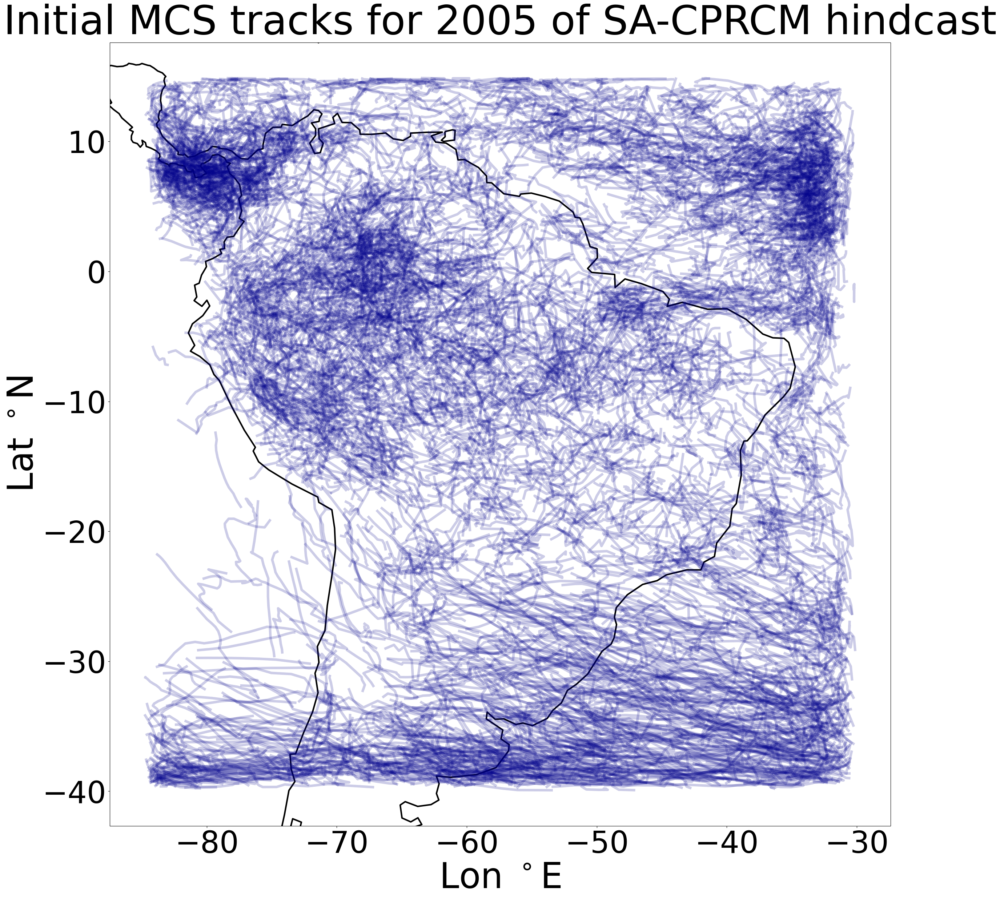

In [8]:
#plots for each timestep:
#========================

axis_extent=[-80,-30,-35,12]

plt.figure()

fig_map,ax_map=plt.subplots(figsize=(30,28),subplot_kw={'projection': ccrs.PlateCarree()})
for cell in original['cell'].dropna().unique():
    if cell == -1:
        continue
    original_i = original[original['cell'] == cell]
    plt.plot(original_i['projection_x_coordinate'],original_i['projection_y_coordinate'], '-',linewidth=5,zorder=2, color='darkblue',alpha=0.2)

plt.gca().coastlines(linewidth=3)

plt.xticks([-80,-70,-60,-50,-40,-30],fontsize=60)
plt.yticks([-40,-30,-20,-10,0,10],fontsize=60)
#plt.ylim(-35,8)
#plt.xlim(-83,-33)
plt.xlabel('Lon $^\circ$E', fontsize=70)
plt.ylabel('Lat $^\circ$N', fontsize=70)

plt.title("Initial MCS tracks for 2005 of SA-CPRCM hindcast",fontsize=80)

In [9]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import mpl_toolkits
from mpl_toolkits.basemap import Basemap

(-35.0, 10.0)

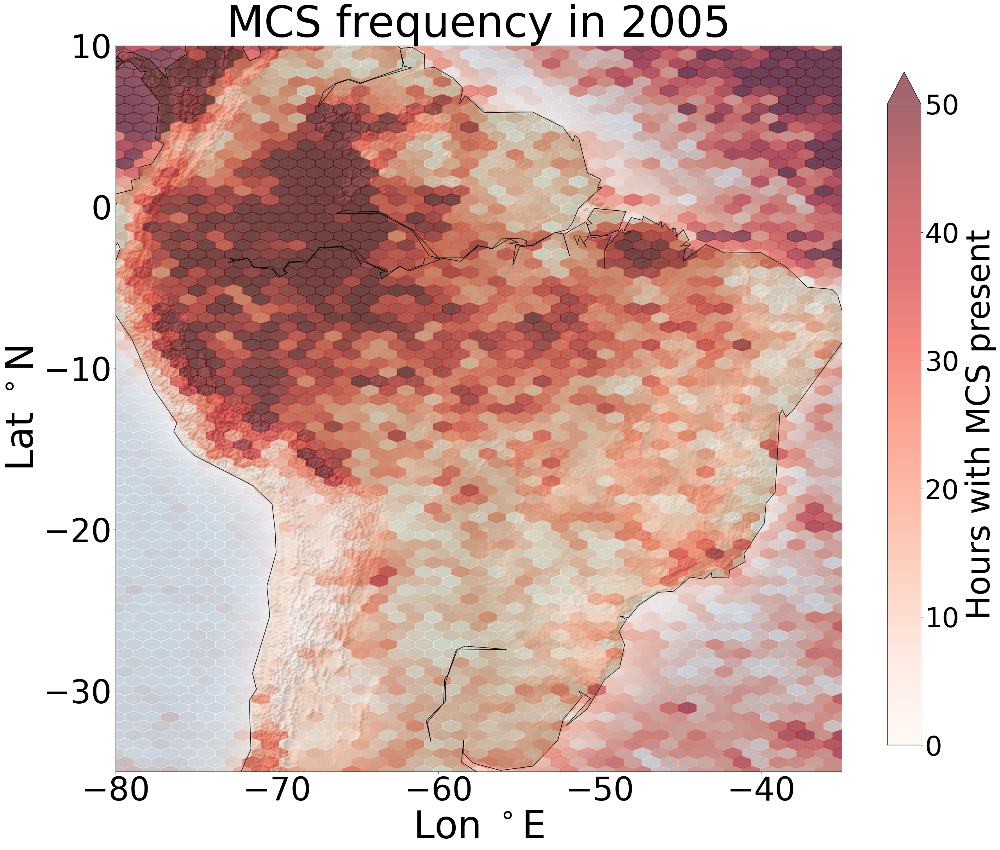

In [10]:
x = original.projection_x_coordinate
y = original.projection_y_coordinate

fig = plt.figure(figsize=(30,28))

ax = plt.subplot(1,1,1)
m = Basemap(llcrnrlon=-80, llcrnrlat=-38,urcrnrlon=-30, urcrnrlat=10) # create Basemap object
m.drawcoastlines() # draw coastlines
#m.drawcountries() # draw political boundaries
m.shadedrelief()

hx = m.hexbin(x, y, gridsize=(40,40),cmap='Reds',alpha=0.6,vmin=0,vmax=50, extent=(-80, -35, -35, 10))
cbar = plt.colorbar(hx, ax=ax, shrink=0.8, label='Hours with MCS present',extend='max')
cbar.set_label(label='Hours with MCS present', size=60, labelpad=10)
cbar.ax.tick_params(labelsize=50)
ax.set_xlabel('Lon $^\circ$E', fontsize=70)
ax.set_ylabel('Lat $^\circ$N', fontsize=70)
plt.xticks([-80,-70,-60,-50,-40,-30],fontsize=60)
plt.yticks([-40,-30,-20,-10,0,10],fontsize=60)
ax.set_title('MCS frequency in 2005', fontsize=80)

plt.xlim(-80,-35)
plt.ylim(-35,10)

In [11]:
dataframes= [original]

for df in dataframes:
    df.timestr = df.timestr.astype(str)
    df['datetime'] = pd.to_datetime(df.timestr.str.split(',\s*').str[0]) 
    set(df['datetime'])

In [12]:
import functions

In [13]:
#unfiltered
init_hours_unfiltered = functions.get_mcs_init(original)
init_hours_unfiltered = np.array(init_hours_unfiltered)
init_hours_unfiltered, bins = np.histogram(init_hours_unfiltered, bins = np.arange(0,25))

diss_hours_unfiltered = functions.get_mcs_diss(original)
diss_hours_unfiltered = np.array(diss_hours_unfiltered)
diss_hours_unfiltered, bins = np.histogram(diss_hours_unfiltered, bins = np.arange(0,25))

init_unfiltered = init_hours_unfiltered/np.nansum(init_hours_unfiltered) * 100
diss_unfiltered = diss_hours_unfiltered/np.nansum(diss_hours_unfiltered) * 100

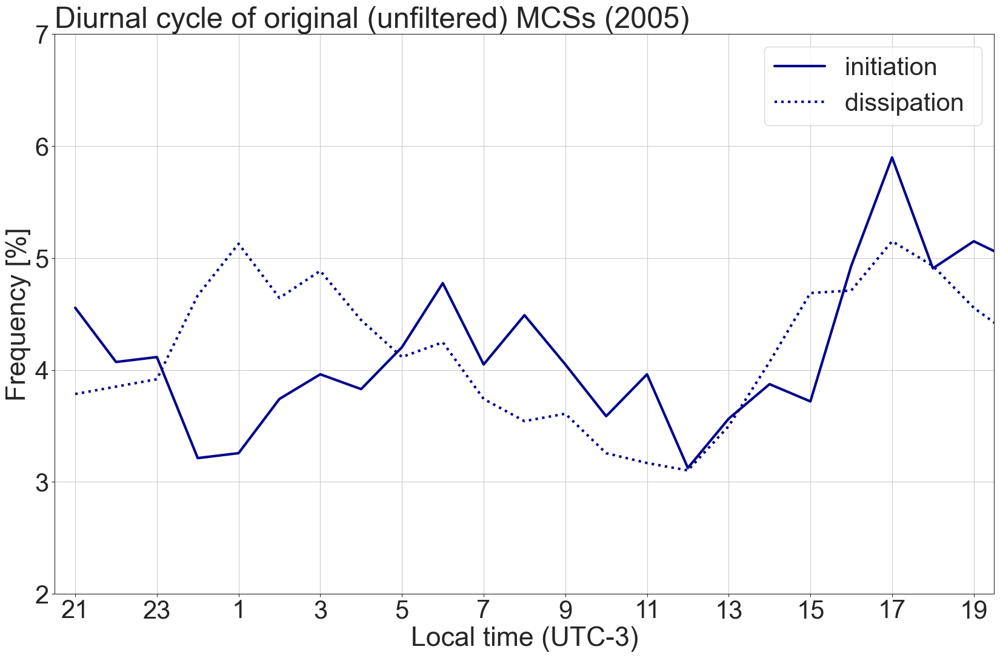

In [14]:
#plot of initiation time of MCSs 
import seaborn as sns 
sns.set_style("ticks")

plt.figure(figsize=(20,12))
f= 30
lf= 30
l=32

ax1 = plt.subplot(1, 1, 1) 
ax1.set_title('Diurnal cycle of original (unfiltered) MCSs (2005)', loc='left', fontsize= 35 )
ax1.plot(np.arange(0,24), init_unfiltered, label = 'initiation ', color= 'darkblue', linewidth = 3)
ax1.plot(np.arange(0,24), diss_unfiltered, label = 'dissipation ', color= 'darkblue', linewidth = 3, linestyle = 'dotted')
#ax1.plot(np.arange(0,24), max_hours_rain_unfiltered, label = 'rain_maxima ', color= 'darkblue', linewidth = 3, linestyle = '-')
#ax1.plot(np.arange(0,24), max_hours_tb_unfiltered, label = 'tb_minima ', color= 'darkblue', linewidth = 3, linestyle = '-,')
ax1.legend(fontsize=lf)

a= np.arange(21,24,2)
b= np.arange(1,20,2)
localtime= np.append(a, b)

labels=localtime.astype(str)
ax1.set_yticks(np.arange(2,8,1))
ax1.set_xticks(np.arange(0,23)[::2])
ax1.set_yticklabels(ax1.get_yticks(),fontsize=f)
ax1.set_xticklabels(labels,fontsize= f)
ax1.set_xlim(-0.5,22.5)
ax1.set_xlabel('Local time (UTC-3)', fontsize= l)
ax1.set_ylabel('Frequency [%]', fontsize= l)

plt.grid(linestyle='-')

In [15]:
# MCS area plots
# ==============
area_unfiltered=functions.get_area(original)

array of MCS areas generated.


In [16]:
u_area_histo, bins = np.histogram(area_unfiltered, bins= np.linspace(60000,900000,22))

In [17]:
u_area_hist = u_area_histo/np.nansum(u_area_histo) * 100

(0.0, 40.0)

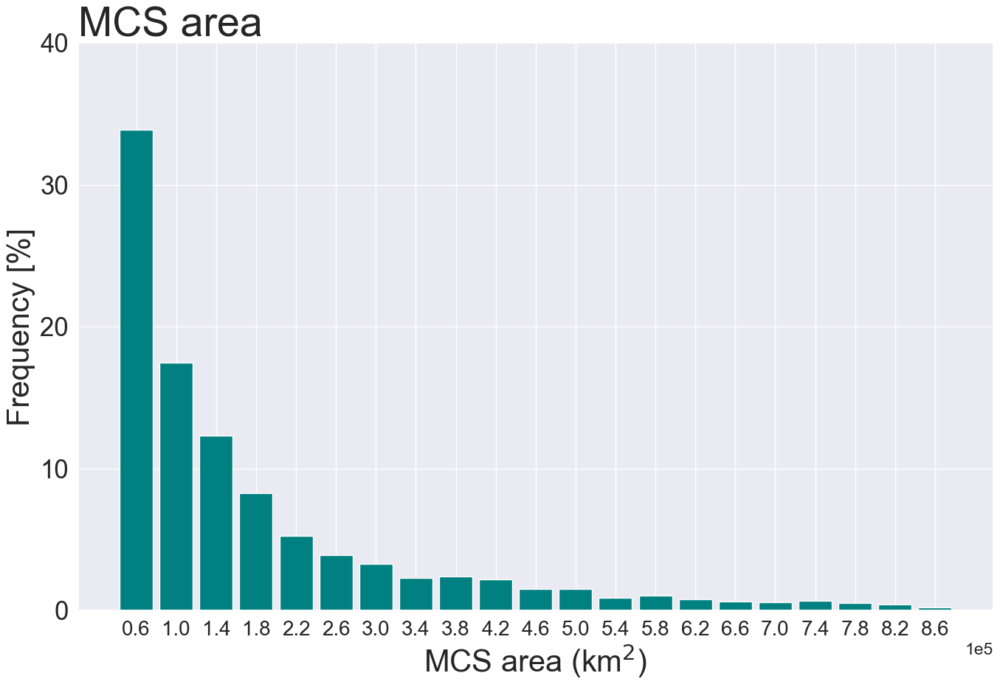

In [18]:
#plot of initiation time of MCSs 
import seaborn as sns 
sns.set(font_scale=1.5)

plt.figure(figsize=(16,10))
t = 40
f= 30
n=25
lf= 35

plt.title('MCS area', loc='left', fontsize= t )
plt.bar(bins[:-1],u_area_hist,width=35000*0.95,color= 'teal', label='original')
plt.xlabel('MCS area (km$^{2}$)', fontsize= f)
plt.xticks(bins.astype(int)[:-1], fontsize=20)
#plt.xticks([60000,100000,140000,180000,220000,260000,300000,340000,380000,420000,460000], fontsize=n)
plt.yticks(np.arange(0,140)[::10],fontsize=n)
#plt.yticks([0,20,40,60,80,100],fontsize=n)
plt.ticklabel_format(style='sci', axis='x', scilimits=(0,0))
#ax1.xaxis.get_offset_text().set_fontsize(25)
plt.ylabel('Frequency [%]',fontsize=f)
plt.ylim(0,40)


In [19]:
# lifetime analysis

#code from the calculate lifetime function in tobac but here I've taken it out of the function so that it's easier to 
#apply to histograms, means, max and mins. It has also been converted from minutes to hours

bin_edges=np.arange(6,30,2)
density=False

cell = original.groupby("cell")
minutes = (cell["time_cell"].max() / pd.Timedelta(minutes=1)).values
lifetime = minutes/60 #converting from minutes to hours

In [20]:
histo, bins = np.histogram(lifetime, bins= np.linspace(4,50,24))


In [21]:
hist = histo/np.nansum(histo) * 100

Text(0, 0.5, 'Frequency (%)')

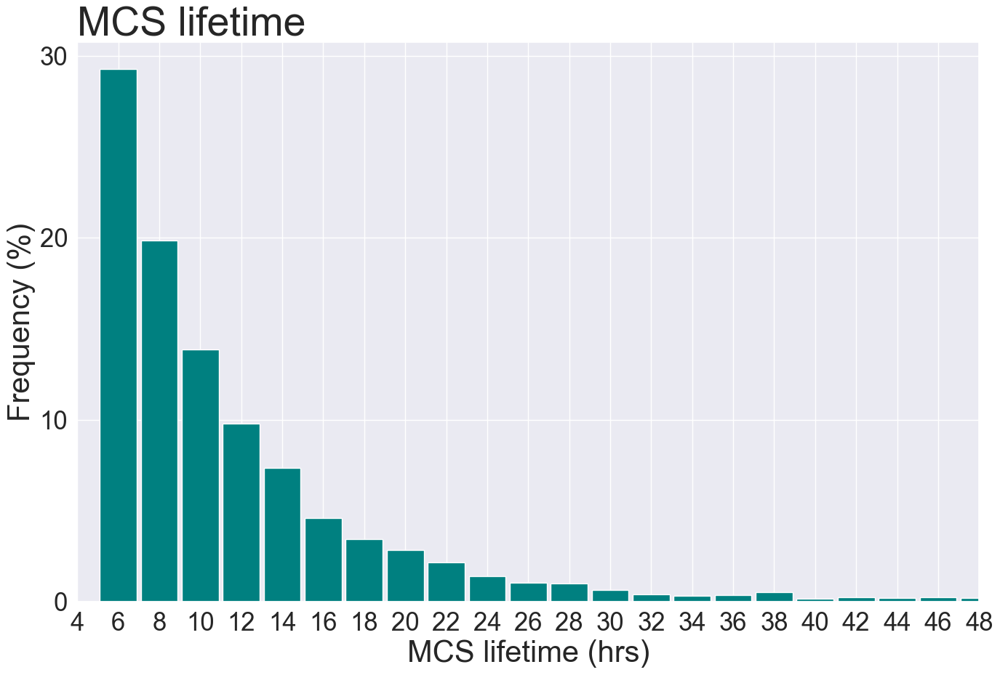

In [22]:
#plots of MCS lifetime
import seaborn as sns 
sns.set(font_scale=1.5)

plt.figure(figsize=(16,10))
t = 40
f= 30
n=25
lf= 35

plt.title('MCS lifetime', loc='left', fontsize= t )
plt.bar(bins[:-1],hist,width=2*0.9,color= 'teal')
plt.xlim(5,28)
plt.xticks(bins.astype(int)[:-1],fontsize=n)
plt.yticks(np.arange(0,40)[::10], fontsize=n)
plt.xlabel('MCS lifetime (hrs)',fontsize=f)
plt.ylabel('Frequency (%)',fontsize=f)

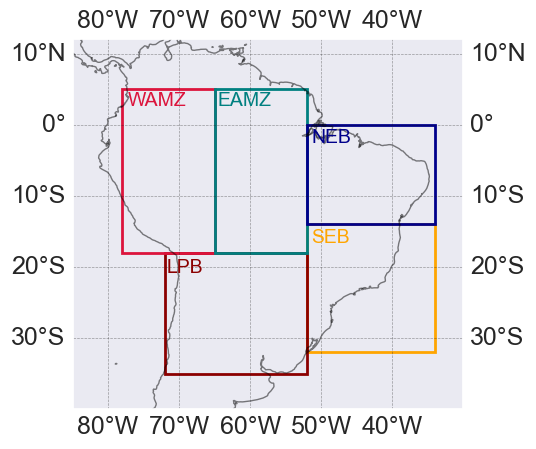

In [23]:
## Create regional boxes & plot them on a map ##

import matplotlib.patches as mpatches
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

f=14

ax = plt.axes(projection=ccrs.PlateCarree())
#hx = m.hexbin(x_210, y_210, gridsize=(8,8),cmap='Reds',alpha=0.6,vmin=0,vmax=170)
#cbar = plt.colorbar(hx, ax=ax, shrink=0.9, pad=0.1, label='Hours with MCS present')
ax.set_extent([-85,-30,-40,12], crs=ccrs.PlateCarree())
ax.coastlines(resolution='50m',alpha=0.5)

gl = ax.gridlines(draw_labels=True, linewidth=0.5, alpha=0.4, color='k',linestyle='--')

# ax.add_patch(mpatches.Rectangle(xy=[-70, -5], width=25, height=10, linewidth=2,
#                                 facecolor='none', edgecolor='teal',
#                                 transform=ccrs.PlateCarree()))
# ax.text(0.28, 0.83, 'NAMZ',color='teal',transform=ax.transAxes)


# ax.add_patch(mpatches.Rectangle(xy=[-70, -15], width=25, height=10, linewidth=2,
#                                 facecolor='none', edgecolor='crimson',
#                                 transform=ccrs.PlateCarree()))
# ax.text(0.28, 0.63, 'SAMZ',color='crimson',transform=ax.transAxes)


### South East Brazil (55-38^w, 25-15^S) ###
### ------------------------------------ ###
seb = ax.add_patch(mpatches.Rectangle(xy=[-52, -32], width=18, height=18, linewidth=2,
                                facecolor='none', edgecolor='orange',
                                transform=ccrs.PlateCarree()))
ax.text(0.61, 0.45, 'SEB',color='orange',transform=ax.transAxes,fontsize=f)


### East Brazil (45-35^W - 25-10^S) ###
### ------------------------------- ###
# eb = ax.add_patch(mpatches.Rectangle(xy=[-45, -25], width=10, height=17, linewidth=2,
#                                 facecolor='none', edgecolor='purple',
#                                 transform=ccrs.PlateCarree()))
# ax.text(0.74, 0.57, 'EB',color='purple',transform=ax.transAxes)


### La Plata Basin (70-45^W, 35-18^S) ###
### --------------------------------- ###
lpb = ax.add_patch(mpatches.Rectangle(xy=[-72, -35], width=20, height=17, linewidth=2,
                                facecolor='none', edgecolor='darkred',
                                transform=ccrs.PlateCarree()))
ax.text(0.24, 0.37, 'LPB',color='darkred',transform=ax.transAxes,fontsize=f)


### Western Amazon (78-65^W, 18-5^S) ###
### -------------------------------- ###
wamz = ax.add_patch(mpatches.Rectangle(xy=[-78, -18], width=13, height=23, linewidth=2,
                                facecolor='none', edgecolor='crimson',
                                transform=ccrs.PlateCarree()))
ax.text(0.14, 0.82, 'WAMZ',color='crimson',transform=ax.transAxes,fontsize=f)


### Eastern Amazon (65-52^W, 18-5^S) ###
### -------------------------------- ###
eamz = ax.add_patch(mpatches.Rectangle(xy=[-65, -18], width=13, height=23, linewidth=2,
                                facecolor='none', edgecolor='teal',
                                transform=ccrs.PlateCarree()))
ax.text(0.37, 0.82, 'EAMZ',color='teal',transform=ax.transAxes,fontsize=f)


### North East Brazil (50-35^W, 15-0^S) ###
### ----------------------------------- ###
neb = ax.add_patch(mpatches.Rectangle(xy=[-52, -14], width=18, height=14, linewidth=2,
                                facecolor='none', edgecolor='darkblue',
                                transform=ccrs.PlateCarree()))
ax.text(0.61, 0.72, 'NEB',color='darkblue',transform=ax.transAxes,fontsize=f)

plt.savefig('regional_boxes.jpg')




In [24]:
import pyproj
import shapely
import shapely.ops as ops
from shapely.geometry.polygon import Polygon
from functools import partial

In [25]:
# [lon0, lat0],[lon1, lat0],[lon1, lat1],[lon0,lat1]
# lon0 = -52
# lat0 = -32
# lon1 = -34
# lat1 = -14

## SEB ##
seb_shape = Polygon([(-52, -32), (-34, -32), (-34, -14), (-52, -14)])
seb_area = ops.transform(partial(pyproj.transform, pyproj.Proj(init='EPSG:4326'),pyproj.Proj(proj='aea',lat_1=seb_shape.bounds[1],lat_2=seb_shape.bounds[3])),seb_shape)

# Print area in km^2
print(seb_area.area/10**6) #10**6 to convert from m2 to km2


## LPB ##
lpb_shape = Polygon([(-72, -35), (-52, -35), (-52, -18), (-72, -18)])
lpb_area = ops.transform(partial(pyproj.transform, pyproj.Proj(init='EPSG:4326'),pyproj.Proj(proj='aea',lat_1=lpb_shape.bounds[1],lat_2=lpb_shape.bounds[3])),lpb_shape)

# Print area in km^2
print(lpb_area.area/10**6) #10**6 to convert from m2 to km2


## WAMZ ##
wamz_shape = Polygon([(-78, -18), (-65, -18), (-65, 5), (-78, 5)])
wamz_area = ops.transform(partial(pyproj.transform, pyproj.Proj(init='EPSG:4326'),pyproj.Proj(proj='aea',lat_1=wamz_shape.bounds[1],lat_2=wamz_shape.bounds[3])),wamz_shape)

# Print area in km^2
print(wamz_area.area/10**6) #10**6 to convert from m2 to km2


## EAMZ ##
eamz_shape = Polygon([(-65, -18), (-52, -18), (-52, 5), (-65, 5)])
eamz_area = ops.transform(partial(pyproj.transform, pyproj.Proj(init='EPSG:4326'),pyproj.Proj(proj='aea',lat_1=eamz_shape.bounds[1],lat_2=eamz_shape.bounds[3])),eamz_shape)

# Print area in km^2
print(eamz_area.area/10**6) #10**6 to convert from m2 to km2


## NEB ##
neb_shape = Polygon([(-52, -14), (-34, -14), (-34, 0), (-52, 0)])
neb_area = ops.transform(partial(pyproj.transform, pyproj.Proj(init='EPSG:4326'),pyproj.Proj(proj='aea',lat_1=neb_shape.bounds[1],lat_2=neb_shape.bounds[3])),neb_shape)

# Print area in km^2
print(neb_area.area/10**6) #10**6 to convert from m2 to km2


3654693.8214197345
3726911.5946339476
3633102.593283632
3633102.59328363
3071174.7816764484


/home/h03/hgilmour/.conda/envs/myclone/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/home/h03/hgilmour/.conda/envs/myclone/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/home/h03/hgilmour/.conda/envs/myclone/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code

In [26]:
# Creating individual datasets of tracks for each regional box. 
# If a track passes through more than 1 box, it will be assigned to the one where it reaches its deepest core. 

import pandas as pd
import numpy as np

# create empty dataframes for each region
eamz_tracks = pd.DataFrame()
wamz_tracks = pd.DataFrame()
neb_tracks = pd.DataFrame()
eb_tracks = pd.DataFrame()
seb_tracks = pd.DataFrame()
lpb_tracks = pd.DataFrame()

for cell in np.unique(original.cell.values):
    print(cell)
    subset = original[original.cell == cell]
    x = subset.projection_x_coordinate.head(1).to_string(index=False)
    y = subset.projection_y_coordinate.head(1).to_string(index=False)
    x = float(x)
    y = float(y)
    point = (x, y)
    point = ax.transData.transform(point) # puts the point into the coordinate grid (IMPORTANT)
    print(lpb.contains_point(point))
    if lpb.contains_point(point) == True:
        lpb_tracks = lpb_tracks.append(subset)
    if eamz.contains_point(point) == True:
        eamz_tracks = eamz_tracks.append(subset)
    if wamz.contains_point(point) == True:
        wamz_tracks = wamz_tracks.append(subset)
    if neb.contains_point(point) == True:
        neb_tracks = neb_tracks.append(subset)
    # if eb.contains_point(point) == True:
    #     eb_tracks = eb_tracks.append(subset)
    if seb.contains_point(point) == True:
        seb_tracks = seb_tracks.append(subset)



    


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

-1
False
1
True
2
False
8
False
12
False
14
True
27
False
28
False
45
False
48
False
50
False
54
False
56
False
57
False
59
False
60
False
62
False
64
False
66
False
70
False
73
False
89
False
91
False
98
True
104
False
106
True
116
False
118
False
122
False
124
False
127
False
128
False
130


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
134
False
135
False
137
False
138
False
151
False
154
False
162
True
165
False
178
True
185
False
195
False
204
True
207
False
212
False
215
False
222
False
223
False
224
False
226
False
234
True
247
False
271
True
276
False
287
False
293
False
296
False
306
False
307
False
309
False
324
False
326
False
339


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
345
False
354
False
358
False
364
False
369
False
371
False
376
False
396
True
399
False
406
False
407
False
408
False
409
False
413
False
414
False
418
False
429
False
434
False
437
False
441
False
442
False
443
False
445
False
449
False
451
False
453
False
458
False
459
True
467
False
492
False
498
False
500
False
514
False
516
False
518
False
522
True
524
False
529
False
539


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

False
541
False
544
False
545
False
548
False
549
False
551
False
552
False
554
False
558
False
566
False
567
True
577
False
584
False
587
False
588
False
590
False
596
False
601
False
603
False
605
False
608
False
611
False
615
False
619
False
621
False
622
False
624
False
630
False
631
False
634
True
636
False
638
False
646
False
647
False
652
False
666
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

670
False
673
True
677
False
681
False
682
False
689
False
695
False
698
True
716
True
721
False
725
False
738
False
753
False
759
False
763
False
764
False
775
False
778
False
780
True
783
True
787
False
826
False
829
False
842
False
855
False
859
False
861
True
865
False
868
False
881
False
893
False
898
False
911
False


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

912
False
915
False
919
False
924
False
925
False
937
False
940
False
944
False
948
False
953
False
965
False
966
False
973
False
981
False
995
False
999
False
1005
True
1006
True
1017
False
1031
False
1042
False
1047
False
1048
True
1050
False
1056
False


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

1067
False
1068
False
1079
False
1081
False
1083
False
1094
False
1109
False
1110
False
1116
False
1117
False
1122
False
1129
False
1134
False
1135
False


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

1139
False
1140
False
1142
False
1155
False
1158
False
1162
False
1184
False
1185
False
1194
False
1195
False
1199
False
1206
False
1209
False
1215
False
1216
False
1222
False
1230
False
1233
False
1234
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

1238
False
1244
False
1246
False
1247
False
1250
False
1261
False
1270
False
1294
False
1296
False
1298
False
1318
False
1322
False
1328
False
1332
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

1334
False
1336
False
1342
False
1350
False
1358
False
1365
False
1368
False
1369
False
1374
False
1377
False
1393
False
1396
False
1417
False
1428


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)


False
1431
False
1435
False
1464
False
1481
False
1482
False


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

1488
False
1498
False
1502
False
1509
False
1516
False
1520
False
1521
False
1522
False
1534
False
1541
False
1560
False
1562
False
1563
False
1568
False
1571
False
1573
False
1574


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
1577
False
1579
True
1584
False
1587
False
1600
False
1608
False
1610
False
1611
False
1618
False
1620
False
1638
False
1640
True
1641
False
1645
False
1660
False
1662


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

True
1668
False
1669
False
1677
False
1679
True
1685
False
1690
False
1691
True
1701
False
1702
False
1704
False
1718
False
1722
True
1723
True
1724
False
1736
False
1737
False
1738
False
1742
False
1746
True
1748
False
1760
False
1764
False
1767
False
1774
False
1787
False
1791
False
1792
False
1793
False
1800
False
1806
False
1808
False
1810
False
1811
False
1814
False
1816
False
1829
False
1830
True
1838
False
1842
False
1853
False
1856
False
1860
False
1861
False
1863
False
1864
False
1869
False
1886
False
1888
False
1889
False
1892
False
1897
False
1908
False
1919
False
1942
False
1964
False
2003
False
2007
False
2015
False
2017
False
2024
True
2028
False
2030
False
2033
True
2037
False
2040
False
2041
False
2044
False
2058
False
2065
True
2066
False
2071
False
2079
False
2083
False
2095
False
2096
False
2098
False
2116
False
2120


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

False
2126
False
2127
False
2132
True
2134
False
2140
False
2154
False
2159
True
2161
True
2165
False
2193
True
2194
False
2207
False
2213
True
2216
False
2218
False
2222
False
2233
False
2240
False
2250
False
2251
False
2255
False
2272
False
2282
False
2284
False
2285
False
2292
False
2301
False
2305
False
2307
False
2313


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
2317
False
2332
False
2334
False
2342
False
2348
False
2352
False
2357
False
2374
True
2375
False
2383
False
2387
False
2407
False
2409
False
2412
False
2418
False
2424
False
2432
False
2445
False
2454
False
2456
False
2466
False
2526
False
2539
True
2541
False
2549
False
2552
False
2553
False
2558
False
2559
False
2560
False
2569
False
2599
False
2613
False
2630
False
2631
False
2639
False
2640
False
2646
False
2647
False
2649
False
2650
False
2653
False
2670
True
2677
False
2692
False
2696
False


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

2701
False
2713
False
2715
False
2716
False
2717
False
2718
False
2723
False
2734
False
2736
True
2750
False
2753
False
2757
False
2767
False
2770
False
2774
False
2776
False
2777
False
2778
False
2781
False
2783
False
2785
False
2795
True
2804
False
2816
False
2819
False
2823
False
2828
False
2838
False
2841
False
2849
False
2852
False
2853
False
2861
True
2870
True
2871
False
2888
False
2889
False
2891
False
2893
False
2898
False
2901
False
2902
False
2906
False
2920
True
2933
False
2939
False
2940
False
2941
False
2945
False
2946
True
2951
False
2953
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pan

2956
False
2960
False
2961
False
2963
False
2964
False
2973
False
2982
False
2992
False
2996
False
2999
False
3005
False
3013
False
3014
False
3017
False
3020
False
3022
False
3023
False
3028
False
3030
False
3032
False
3035
False
3040
False
3047
False
3051
False
3062
False
3063
False
3069
False
3079
False
3095
False
3096
False
3101
False
3104
True
3110
False
3117
True
3137
False
3145
False
3158
False
3160
False
3161
False
3164
False
3171
False
3173
False
3175
False
3182
True
3194
False
3198
True
3204
False
3209
False
3212
False
3215
False
3236
False
3237
False
3242
False
3244
False
3245
False
3252
False
3258
False
3261
False
3264
False
3272
False
3275
False
3278
False
3279
True
3298
False
3299
False
3301
False
3303
False
3309
False
3311
False
3312
True
3315
True
3317
False
3319
False
3322
False
3345


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
3346
False
3353
False
3366
False
3369
True
3371
False
3382
False
3383
False
3385
False
3397
True
3400
False
3403
True
3412
False
3413
False
3414
False
3421
False
3426
False
3431
False
3437
False
3440
False
3441
False
3445
False
3455
False
3457
False
3460
False
3461
False
3465
False
3467
False
3468
False
3471
False
3481
False
3484
False
3485
False
3502
False
3514
False
3517
False
3518
False
3530
False
3532
False
3538
False
3540
False
3544
False
3551
True
3554
False
3560
True
3570


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
3571
False
3572
False
3579
False
3585
False
3589
True
3590
False
3592
False
3593
True
3598
False
3601
False
3604
False
3611
False
3617
False
3627
False
3633
False
3635
True
3645
False
3655
False
3660
True
3662
False
3665
False
3669
False
3670
False
3671
False
3674
True
3675
False
3678
False
3680
False
3701


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
3705
True
3716
False
3720
False
3723
False
3730
False
3733
False
3739
False
3740
False
3741
False
3751
False
3752
False
3766
False
3772
False
3781
False
3790
False
3791
False
3794
False
3796
False
3797
False
3798
False
3799
True
3807
False
3824
False
3825
False
3829
False
3834
False
3837
False
3838
True
3840
False
3848
False
3850
False
3861
False
3862
False
3864
True
3868
False
3870
False
3873


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

True
3875
True
3877
False
3883
True
3890
False
3897
True
3907
True
3911
True
3913
False
3915
False
3918
False
3922
False
3932
False
3950
False
3951
False
3955
False
3959
False
3962
True
3968
False
3971
False
3976
False
3981
False
3982
False
3987
True
3988
True
3991
False
3994
False
3997
False
4001
False
4003
False
4006
False
4011
False
4012
False
4015
False
4025
False
4028
False
4033


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

False
4046
False
4055
False
4056
False
4057
False
4068
False
4070
False
4071
False
4075
False
4078
True
4089
False
4095
False
4098
False
4101
False
4104
False
4108
False
4110
False
4123
True
4138
False
4141
False
4146
False
4152
False
4157
False
4160
False
4161
False
4163
False
4165
False
4169
False
4172
False
4177
False
4180
False
4196
True
4199
True
4204
False
4208
False
4214
False
4215
False
4218
False
4222
False
4236
False
4238
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from panda

4246
False
4264
False
4275
False
4284
True
4285
True
4290
False
4296
False
4298
False
4299
False
4306
False
4307
False
4311
False
4314
False
4319
False
4358
False
4359
False
4365
False
4376
False
4384
False
4388
False
4403
False
4409
False
4421
False
4424
False
4427
False
4428
False
4430
False
4432
False
4435
False
4454
False
4459
False
4464
False


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

4471
False
4474
False
4479
False
4486
False
4487
False
4518
False
4524
False
4526
False
4536
False
4538
False
4544
False
4555
False
4569
False
4575
False
4587
False
4590
False
4591
False
4598
False
4601
False
4602
False
4603
False
4609
False
4617
False
4621
False
4622
False
4629
False
4631
False
4637
False
4641
False
4654
False
4662
False
4697
False
4763
False
4764
False
4779
False
4820
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

4821
False
4828
False
4833
False
4841
False
4842
False
4847
False
4853
False
4855
False
4857
False
4860
False
4867
False
4869
False
4871
False
4874
False
4888
False
4897
False
4920
False
4922
False
4923
False
4924
False
4933
False
4939
False
4941
False
4949
False
4950
False
4951
False
4960
False
4967
False
4970
False
4974
False
4976
False
4977
False
4980
False
4982
False
4987
False
5004
False
5005
False
5006
True
5009
False
5010
False
5017
False
5029
False
5030
False


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

5031
False
5043
False
5044
False
5057
False
5062
False
5066
False
5072
False
5077
False
5090
False
5092
False
5094
False
5097
False
5105
False
5108
False
5118
False
5120
False
5122
False
5127
False
5132
False
5133
False
5147
False
5151
False
5156
False
5163
True
5166
False
5169
False
5173
False
5179
False
5181
True
5182
False
5185
False
5186
False
5199
False
5202
False
5205
False
5206
False
5211
False
5215
False
5218
True
5220
False
5221


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
5231
False
5232
False
5233
False
5234
False
5235
False
5236
True
5237
False
5241
False
5249
False
5256
False
5257
False
5259
False
5261
False
5263
False
5266
False
5272
False
5275
False
5276
False
5278
False
5279
False
5285
False
5288
False
5292
False
5301
False
5310
False
5315
False
5318
False
5329
False
5331
False
5334
False
5340
False
5341
False
5347
False
5355
False
5365
False
5366
False
5367
False
5389
False
5400
False
5410
False
5415
False
5421
False
5425
False
5427
False
5436


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pan

False
5439
False
5440
False
5446
False
5447
False
5449
False
5450
False
5453
False
5457
False
5461
False
5470
False
5480
False
5489
False
5491
False
5493
False
5501
False
5512
False
5516
False
5541
False
5547
True
5552
False
5562
False
5567
False
5568
False
5572
False
5574
False
5575
False
5585
False
5588
False
5590
True
5591
False
5594
False
5597
False
5599
False
5612
False
5622
False
5630
True
5647
False
5651
False
5656
False
5661
False


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

5665
False
5667
False
5670
False
5671
False
5679
False
5704
False
5707
False
5711
False
5713
False
5723
False
5732
False
5741
False
5753
False
5768
False
5769
False
5773
False
5775
False
5791
False
5792
False
5804
True
5824
True
5831
False
5840
False
5841
False
5842
False
5854
False
5856
False
5859
False
5861
False
5862
False
5864
False
5867
True
5879
False
5890
False
5896
True
5901


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

False
5926
False
5927
False
5941
False
5943
False
5945
False
5955
False
5961
False
5964
True
5967
False
5972
False
5974
False
5991
False
6002
False
6019
False
6022
False
6023
False
6034
False
6036
False
6049
False
6051
False
6056
False
6061
False
6066
False
6067
False
6075
False
6089
False
6108
False
6110
False
6119
False
6123
False
6126
False
6139
False
6141
False
6143
False
6144
False
6146
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

6149
False
6163
False
6167
False
6170
False
6173
False
6182
False
6186
False
6187
False
6191
False
6196
False
6204
False
6210
False
6211
False
6214
False
6223
False
6233
False
6236
False
6245
False
6246
False
6262
False
6263
False
6267
False
6276
False
6279
False
6283
False
6295
False
6302
False
6308
False
6309
False
6317
False
6329
False
6333
False
6338
False
6339
False
6341
False
6359
False
6363
False
6376


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

False
6389
False
6397
False
6400
False
6401
False
6410
False
6423
False
6426
False
6428
False
6436
False
6441
False
6448
False
6465
False
6470
False
6471
False
6477
False
6486
False
6487
False
6517
False
6518
False
6524
False
6549
False
6553
False
6556
True
6569
False
6573
False
6581
False
6590
False
6598
False
6601
False
6608
False
6613
False
6619
False
6624
True
6633
False
6634
False
6638
False
6639
False
6643
False
6645
False
6650
False
6651
False
6655
False
6656
False
6658
True
6660
False
6672


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
6676
False
6679
False
6684
False
6686
False
6694
False
6695
False
6698
False
6704
False
6705
True
6710
False
6715
False
6716
False
6720
False
6721
False
6722
False
6728
False
6734
False
6738
False
6755
False
6756
False
6761
False
6764
False
6772
False
6777
True
6780
False
6785
False
6790
True
6792
False
6799
False
6804
False
6805
False
6806


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
6822
False
6835
False
6836
False
6838
False
6841
False
6848
False
6855
False
6860
False
6864
False
6879
False
6884
False
6892
False
6896
False
6906
False
6909
True
6912
False
6917
False
6922
False
6924
False
6928
False
6931
False
6936
False
6941
False
6944
True
6947
False
6948
False
6971
True
6977
False
6980
False
6990
False
6993
False
7004
False
7007
False
7008
False
7018
False
7020
False
7060
False
7065
False
7071
False
7073
False
7079
False
7092
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from panda

7103
False
7115
False
7119
True
7127
False
7129
True
7130
False
7132
False
7138
False
7140
False
7149
False
7158
False
7162
False
7168
False
7176
False
7185
False
7191
True
7192
False
7194
False
7195
False
7196
False
7197
False
7203
False
7204
False
7211
False
7212
False
7221
False
7227
False
7234
False
7242
False
7247
True
7256
False
7271
False
7272
False
7274
False
7279
False
7280
False
7289
False
7297
False
7298
False
7301
False
7305
False
7307
False
7310
True
7331
True
7333
False
7338
False
7343
False
7345
False
7346
False
7354


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
7355
False
7357
False
7358
False
7365
False
7367
False
7386
False
7389
False
7390
False
7393
False
7397
False
7399
False
7400
False
7408
False
7417
False
7420
False
7422
False
7423
False
7428
False
7429
False
7430
True
7431
False
7435
False
7439
False
7441
False
7444
False
7446
False
7448
False
7449
False
7451
False
7463
False
7468
True
7477
False
7483
False
7491
False
7492
True
7497
False
7504
False
7509
False
7512
False
7515
False
7516
False
7526
False
7536
True


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

7541
False
7543
False
7544
False
7549
False
7550
False
7554
False
7556
False
7565
False
7573
False
7576
True
7579
False
7580
False
7590
True
7591
False
7603
False
7604
True
7615
False
7620
True
7621
True
7625
False
7629
False
7634
False
7636
False
7641
False
7646
False
7649
False
7660
False
7661
False
7662
True
7666
False
7668
False
7671
False
7678
False
7679
False
7688
False
7693
False
7696
False
7697
False
7704
False
7716
False
7720
False
7723
False
7728
False
7733


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
7738
False
7742
False
7743
False
7755
False
7756
False
7762
False
7764
False
7769
False
7774
False
7784
False
7788
False
7790
False
7791
False
7792
False
7793
False
7851
False
7852
False
7853
False
7858
False
7861
True
7865
False
7869
False
7870
False
7871
False
7873
True
7876
False
7879
False
7886
False
7901
False
7907
False
7925
False
7926
False
7928
False
7954
False
7963
False
7973
False
7980
False
7984
False
7990
False
7995
False
7998
False
8000
True
8001


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
8002
False
8004
False
8012
False
8013
False
8015
False
8023
False
8030
False
8038
False
8039
False
8044
False
8048
False
8058
False
8064
False
8078
False
8079
False
8080
False
8082
False
8085
False
8086
True
8087
False
8097
False
8100
False
8101
False
8109
True
8120
False
8125
False
8128
False
8150
True
8173
False
8174
False
8175
False
8177
False
8186
False
8187
False
8189
False
8193
False
8197
False
8207
False
8209
False
8211
False
8212
False
8219
False
8235
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

8240
False
8250
False
8256
True
8269
False
8270
False
8272
False
8273
False
8281
False
8289
False
8295
False
8296
False
8297
False
8299
False
8301
False
8317
False
8320
False
8325
False
8326
False
8343
False
8348
False
8351
False
8354
False
8360
True
8363
False
8364
False
8366
True
8371
False
8372
True
8376
False
8384
False
8388
False
8395
False
8396
False
8399
False
8400
False
8401
False
8406
False
8413
True
8424
False
8425
True
8428
False
8432
False
8433
False
8449
False
8450
False
8452


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

False
8459
True
8473
False
8491
False
8504
False
8506
False
8507
True
8509
True
8517
False
8532
False
8533
False
8539
False
8543
True
8556
False
8558
False
8575
False
8580
False
8581
False
8582
False
8589
False
8590
False
8594
False
8605
False
8606
False
8616
False
8622
False
8632
False
8634
False
8641
False
8645
False
8646
False
8656
False
8657
False
8659
False
8678
False
8681
False
8688
False
8692
True
8694
False
8699
False
8707
False
8708
False


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

8709
False
8716
False
8717
False
8737
False
8738
False
8741
False
8746
True
8750
False
8753
False
8761
False
8766
False
8776
False
8777
False
8778
False
8783
False
8784
False
8786
False
8789
False
8793
False
8798
False
8802
False
8803
False
8805
False
8815
False
8816
False
8817
False
8819
False
8826
False
8828
False
8833
False
8835
False
8851
False
8853
False
8855
False
8860
False
8864
False
8874
False
8899
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

8902
False
8903
False
8908
False
8910
False
8913
False
8918
False
8921
False
8922
False
8927
False
8951
False
8953
False
8955
False
8964
False
8977
False
8984
False
8986
False
8987
False
8991
False
9000
False
9001
False
9004
False
9008
False
9019
False
9023
False
9026
False
9030
False
9033
False
9037
False
9040
False
9043
False
9048
False
9052
False
9057
False
9058
False
9069
True
9072
False
9077
False
9078
False
9081
False
9085
False
9088
False
9092
False
9095
True


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from panda

9097
False
9100
False
9101
False
9119
False
9122
False
9127
False
9129
False
9132
False
9134
False
9137
False
9140
False
9147
False
9150
False
9155
False
9166
False
9180
True
9182
False
9184
False
9185
False
9189
False
9193
False
9199
False
9200
False
9204
False
9218
False
9227
False
9244
False
9249
True
9250
False
9251
False
9257
False
9259
False
9264
False
9265
False
9266
False
9267
False
9271
False
9273
False
9276
False
9296
False
9301
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

9317
False
9322
False
9326
False
9327
False
9329
False
9330
False
9331
False
9356
False
9360
False
9369
False
9389
False
9393
False
9395
False
9396
False
9400
False
9404
False
9405
False
9406
False
9422
False
9448
False
9457
False
9462
False
9466
False
9474
False
9482
False
9484
False
9493
False
9496
False
9497
False
9510
False
9514
False
9534
False
9535
False
9536
False
9537
False
9544
False
9555
False
9556
False
9559
False
9564
False
9575
False
9576
False
9583
False
9584
False
9586
False
9593
False
9596
False
9598
False
9602


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
9610
False
9617
False
9624
False
9632
False
9633
False
9634
False
9650
False
9651
False
9658
False
9663
False
9668
True
9676
False
9685
False
9688
False
9695
False
9698
False
9701
False
9702
False
9704
False
9709
False
9712
False
9714
False
9726
False
9741
False
9743
False
9744
False
9745
False
9751
False
9752
True
9754
False
9760
False
9761
False
9767
False
9787
False
9791
False
9800
False
9809
False
9810
False
9825
False
9835
False
9841
False
9842
False
9859
False
9860
True
9862
False
9871
False
9872
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

9875
False
9879
False
9895
False
9902
False
9905
False
9908
False
9910
False
9911
False
9912
False
9915
False
9917
False
9927
False
9952
False
9964
False
9972
True
9976
False
9983
False
9989
False
9990
False
9995
False
9996
False
10001
False
10002
False
10026
False
10028
False
10030
False
10039
False
10040
False
10044
False
10053
False
10061
False
10067
False
10068
False
10069
False
10071
False
10077
False
10089
False
10093
False
10101
False
10104
False
10107
False
10110
False
10113
False
10122
False
10137
False
10138
False
10141
False
10149


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
10150
False
10162
False
10164
False
10173
False
10180
False
10189
False
10192
True
10194
False
10195
False
10198
False
10201
False
10207
False
10217
False
10218
False
10219
False
10227
False
10256
False
10259
False
10265
False
10267
False
10273
False
10280
False
10283
False
10287
False
10302
False
10311
False
10313
False
10314
False
10338
False
10340
False
10341
False
10362
False
10368
False
10369
False
10374
False
10385
False
10386
False
10390
False
10400
False
10404
False
10410
True
10412
False
10413


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
10414
False
10419
False
10420
False
10429
False
10430
True
10432
False
10437
False
10438
False
10445
False
10446
True
10452
False
10453
False
10455
False
10456
False
10457
False
10463
False
10464
False
10465
True
10476
False
10481
False
10493
False
10501
False
10508
False
10516
False
10519
False
10527
False
10529
False
10531
False
10534
False
10538
False
10552
False
10554
False
10563
False
10564
False
10565


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
10566
False
10568
False
10577
False
10578
False
10583
False
10587
False
10592
False
10594
False
10595
False
10603
False
10609
False
10616
False
10625
False
10627
False
10648
False
10650
False
10659
False
10664
False
10670
False
10672
False
10674
False
10684
False
10687
True
10694
False
10699
False
10704
False
10706
False
10713
False
10714
False
10715
False
10721
False
10730
False
10738
False
10757
False
10763
False
10779
False
10780
False
10784
False
10788
False
10789
False
10795
False
10798
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

10800
False
10804
False
10808
False
10813
False
10814
False
10818
False
10821
False
10825
False
10826
False
10827
False
10829
False
10842
False
10844
False
10846
False
10847
False
10850
False
10851
False
10854
False
10856
False
10863
False
10868
False
10870
False
10882
False
10883
False
10901
False
10911
False
10917
False
10923
False
10928
False
10935
False
10939
False
10942
False
10944
False
10947
False
10948
True
10949
False
10958
False
10959
False
10962
False
10963
False
10973
False
10978
False
10985
True
10987
False
10994
False
10995
False
10997
False
11001
False
11015
True
11020
False


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

11033
False
11041
False
11050
False
11057
False
11058
False
11070
False
11074
False
11075
False
11080
False
11084
False
11089
False
11090
False
11091
False
11094
False
11098
False
11104
False
11106
False
11109
False
11112
False
11113
False
11114
False
11118
False
11120
False
11121
False
11122
False
11128
False
11129
True
11131
False
11133
False
11135
False
11138
False
11142
False
11143
False
11149
False
11150
False
11157
False
11159
False
11160
False
11168
False
11172
False
11177
False
11180
False
11181
False
11187


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
11189
False
11199
False
11206
False
11208
False
11213
False
11220
False
11224
False
11230
False
11237
False
11250
False
11255
False
11256
False
11257
False
11260
False
11266
False
11282
False
11283
False
11289
False
11292
False
11295
False
11296
True
11302
False
11310
False
11315
False
11326
False
11338
False
11340
False
11346
False
11349
False
11355
False
11357
False
11358
False
11363
False
11364
False
11366
True
11377
False
11382
False
11389
False
11394
False
11396
False
11400
False
11405
False
11409
False
11411
False
11414
False
11416
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pan

11418
False
11419
False
11426
False
11428
False
11429
False
11447
False
11448
False
11454
False
11471
False
11473
False
11505
False
11506
False
11509
False
11510
False
11511
False
11527
False
11530
False
11531
False
11535
False
11539
False
11542
False
11544
False
11545
False
11554
False
11555
False
11558
False
11565
False
11573
False
11583
False
11584
False
11589
False
11594
False
11597
False
11602
False
11617
False
11627
False
11635
False
11645
False
11654
False
11661
False
11663
False
11664
False
11671
False
11673
False
11674
False
11692
False
11694
False
11695
False
11698
False
11704
False
11714
False
11718


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
11719
False
11725
False
11726
False
11728
False
11729
False
11747
False
11749
False
11750
False
11752
False
11759
False
11760
False
11762
False
11763
False
11767
True
11772
False
11774
False
11775
False
11778
False
11781
False
11784
False
11787
False
11796
False
11797
True
11798
False
11805
False
11817
False
11820
False
11821
False
11827
False
11853
False
11854
False
11855
False
11857
False
11858
False
11860
False
11864
True
11865
False
11866
False
11869
False
11870
False
11876
False
11877
False
11879
False
11882
False
11884
False
11892
False
11903
False
11911
True
11925


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
11928
False
11930
False
11932
False
11940
False
11943
False
11949
False
11969
False
11973
False
11978
False
11984
False
11988
False
11989
True
11994
False
11996
False
11997
False
11998
False
12006
False
12009
False
12015
False
12017
True
12030
False
12038
False
12040
True
12043
False
12044
False
12045
False
12047
False
12050
False
12055
False
12058
False
12066
True
12067
False
12074
False
12076
False
12079
False
12080
False
12081
False
12092
False
12107
False
12115
False
12121
False
12122
False
12126
False
12128
False
12134
True
12136
False
12137
False
12141


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

False
12145
False
12147
False
12152
True
12154
False
12158
False
12164
False
12169
False
12184
True
12188
False
12189
False
12194
False
12195
False
12198
False
12210
True
12214
False
12222
False
12225
False
12238
False
12239
False
12243
False
12263
False
12267
False
12269
False
12285
False
12288
False
12296
False
12297
False
12299
False
12303
False
12306
False
12308
False
12327
False
12328
False
12334
False
12341
True
12347
False
12353
False
12357
False
12361
False
12365
False
12369
False
12370
False
12373
True
12374
False
12378
False
12382
False
12384
False
12391
False
12392
False
12394
False
12398
False
12404
False
12407
False
12410
False
12415
False
12416
False
12419
False
12420
False
12425
False
12426
False
12427
False
12435
False
12439
False
12443
False
12452
False
12453
False
12454
False
12456
False
12461
False
12464
False
12468
False
12472
False
12473
False
12477
True
12479
False
12486
False
12488
False
12490
False
12494
False
12504
False
12507
False
12508
False
12509
False
1251

/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

12563
False
12569
False
12574
False
12576
False
12584
True
12592
True
12598
False
12599
False
12623
False
12627
False
12629
False
12631
False
12633
True
12639
False
12646
False
12648
True
12649
False
12651
False
12655
False
12659
False
12669
True
12673
False
12675
False
12687
False
12689
False
12691
False
12698
False
12699
False
12700
False
12705
False
12706
False
12707
False
12715
False
12717
False
12720
False
12721
False
12724
False
12727
False
12728
False
12752
False
12758
False
12759
True
12761
False
12762


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
12763
False
12765
False
12767
False
12769
False
12770
False
12772
False
12773
True
12792
False
12794
False
12804
False
12807
False
12810
False
12814
False
12816
False
12817
False
12818
False
12826
False
12827
False
12828
False
12831
False
12836
False
12841
False
12842
False
12843
False
12844
False
12849
False
12851
False
12860
False
12877
False
12878
False
12881
True
12888
False
12889
False
12890
False
12895
False
12896
False
12898
False
12902
True
12907
False
12912
False
12914
False
12917
False
12927
False
12935
False
12937
False
12938
False
12942
False
12953
False
12959
False
12963
False
12971
False
12975
False
12977
False
12979
False


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

12980
False
12981
False
12985
False
12998
False
12999
False
13014
False
13019
False
13020
False
13021
False
13022
False
13030
False
13032
False
13044
False
13047
False
13052
False
13053
False
13058
False
13063
False
13066
False
13071
False
13073
False
13074
False
13075
False
13076
False
13077
False
13080
False
13083
False
13090
False
13097
False
13107
False
13111
False
13117
False
13120
False
13121
False
13124
False
13127
False
13131
False
13132
False
13144
False
13150
False
13151
False
13155
False
13160
False
13165
False
13168
False
13170
False
13172
False
13173
False
13174
False
13180
False
13187
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pan

13191
False
13196
False
13204
False
13206
False
13208
False
13210
False
13211
False
13213
False
13216
False
13219
False
13234
False
13235
True
13239
False
13244
False
13250
False
13255
False
13256
False
13268
False
13269
False
13273
False
13280
False
13281
False
13291
False
13309
False
13324
False
13327
False
13329
False
13331
False
13332
False
13334
False
13336
False
13341
False
13342
False
13345
False
13346
False
13350
False
13353
False
13362
False
13363
False
13365
False
13366
False
13369
False
13375
False
13381
False
13382
False
13387
False
13392
False
13397
False
13404
False
13413
False
13424
False
13425
False


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

13430
False
13433
False
13436
False
13438
False
13442
False
13444
False
13448
False
13449
False
13455
False
13459
False
13469
False
13474
True
13476
False
13478
False
13480
False
13482
True
13483
False
13488
False
13495
False
13502
True
13507
True
13518
False
13523
False
13526
True
13533
False
13544
False
13545
False
13548
False
13557
False
13558
False
13559
False
13566
False
13577
False
13578
False
13579
False
13581
False
13583
False
13589
False
13608
False
13609
False
13611
False
13622
False
13623
False
13625
False
13630
False
13643
False
13652
False
13661
False
13667
False
13673
False


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

13675
False
13676
False
13683
False
13688
False
13690
False
13692
False
13706
False
13707
False
13708
False
13711
False
13719
False
13721
False
13726
True
13727
False
13732
False
13738
False
13739
False
13743
False
13748
False
13752
False
13761
False
13763
False
13772
False
13775
True
13777
False
13778
True
13781
False
13783
False
13785
False
13789
False
13793
False
13806
False
13808
True
13810
False
13813
False
13814
False
13818
False
13822
False
13823
False
13830
False
13837
False
13838
False
13843
False
13844
False
13846
False
13855
False
13857
False
13860
False
13863
False
13871


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
13878
False
13880
False
13892
False
13893
False
13894
False
13896
False
13897
False
13910
False
13913
False
13916
False
13917
False
13920
False
13931
False
13935
False
13936
False
13948
False
13951
False
13952
False
13954
False
13956
False
13958
False
13972
False
13973
False
13981
False
13988
False
14000
False
14003
False
14011
False
14012
False
14015
False
14020
False
14022
False
14026
False
14027
False
14030
False
14034
False
14039
False
14046
False
14051
False
14054
False
14056
False
14062
False
14063
False
14066
False
14068
False
14071
False
14072
False
14074
False
14076
False
14080


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
14084
False
14086
False
14096
False
14100
False
14107
False
14108
False
14109
False
14111
False
14113
False
14118
False
14127
False
14133
False
14134
False
14138
False
14146
False
14150
False
14153
False
14158
False
14165
False
14166
False
14169
False
14181
False
14185
False
14190
False
14198
True
14201
False
14204
False
14211
False
14218
False
14223
False
14227
False
14229
False
14232
False
14233
False
14234
False
14242
False
14243
False
14245
False
14248
False
14257
False
14260
False
14266
False
14269
False
14284
False
14285
False
14288
True
14291
True
14294
False
14296
False
14298
False
14306
False
14310
False
14329
False
14331


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
14332
False
14340
False
14342
False
14346
False
14356
False
14357
False
14368
False
14374
False
14379
False
14382
False
14384
False
14394
False
14395
False
14399
False
14404
False
14411
False
14421
False
14422
False
14426
False
14428
False
14429
False
14435
False
14437
False
14445
False
14449
False
14451
False
14468
False
14472
False
14478
False
14480
False
14487
False
14488
False
14491
False
14493
False
14495
False
14504
False
14511
False
14514
False
14515
False
14520
False
14525
False
14527
False
14531
False
14535
False
14539
False
14545
False
14548
False
14550
False
14552
False
14557
False
14558
False
14559
False
14561
False
14565
False
14577


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
14583
False
14585
False
14586
False
14587
False
14596
False
14599
False
14609
False
14610
False
14615
False
14618
False
14624
False
14636
False
14637
False
14639
False
14646
False
14649
False
14655
False
14659
False
14662
False
14663
False
14666
False
14670
False
14672
False
14682
False
14683
False
14692
False
14694
False
14695
False
14698
False
14701
False
14709
False
14711
False
14713
False
14717
False
14718
False
14721
False
14722
False
14723
False
14728
False
14732
False
14742
False
14743
False
14744
False
14747
False
14748
False
14749
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from panda

14755
False
14760
False
14764
False
14765
False
14766
False
14768
False
14775
False
14782
False
14783
False
14785
False
14792
False
14793
False
14812
False
14813
False
14828
False
14831
True
14833
False
14852
False
14863
False
14889
False
14893
False
14896
False
14905
True
14907
False
14908
False
14913
False
14914
False
14916
False
14921
False
14922
False
14923
False
14924
False
14926
False
14928
False
14932
False
14933
False
14935
False
14938
False
14944
False
14947
False
14950
False
14953
False
14958
False
14961
False
14962
False
14964
False
14967
False
14975
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

14977
False
14978
False
14983
False
14989
False
14994
False
15001
False
15008
False
15029
False
15031
False
15036
False
15041
False
15048
True
15050
False
15052
False
15055
False
15058
False
15059
False
15067
False
15068
False
15076
False
15079
False
15085
False
15088
False
15090
False
15101
False
15103
False
15106
False
15107
False
15110
False
15111
False
15114
False
15130
False
15131
False
15132
False
15135
False
15136
False
15141
False
15143
False
15153
False
15179
False
15183
False
15189
False
15192
False
15197
False
15200
False
15205
False
15206
False
15210
False
15212
False
15214
False
15215
False
15223
False
15225
False
15226
False
15227
False
15234
False
15236
False
15243
False
15249
False
15252
False
15257
False
15258
False
15262
False
15266
False
15271
False
15272
False
15283
False
15287
False
15289
False
15294
False
15296
True
15301
False
15309
False
15310
False
15313
False
15322
False
15324
False
15327
False
15328
False
15338
False
15344
False
15348
False
15351
False
15354


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

15413
False
15414
False
15415
False
15424
False
15427
False
15429
False
15435
False
15439
False
15442
False
15446
False
15456
False
15469
False
15481
False
15487
False
15503
False
15507
False
15509
False
15517
False
15522
False
15525
False
15527
False
15540
False
15544
False
15551
False
15553
False
15557
False
15558
False
15561
False
15570
False
15572
False
15580
False
15588
False
15597
False
15599
False
15603
False
15604
False
15605
False
15609
False
15617
False
15625
False
15628
False
15629
False
15633
True
15636
False
15645
False
15666
True
15672
False
15673
False
15686


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pan

False
15694
False
15695
False
15697
False
15698
False
15699
False
15705
False
15715
False
15720
False
15729
False
15733
False
15735
False
15736
False
15737
False
15742
False
15754
False
15755
False
15758
False
15760
False
15762
False
15766
False
15771
False
15775
False
15776
False
15787
False
15788
True
15794
False
15801
False
15804
False
15814
False
15818
False
15831
False
15852
False
15854
False
15855
False
15862
False
15864
False
15867
False
15879
False
15885
False
15887
False
15901
False
15908
False
15912
False
15913
False
15917
False
15920
False
15926


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pan

False
15934
False
15945
False
15946
False
15948
False
15960
False
15962
False
15968
False
15969
False
15976
False
15979
False
15983
False
15998
False
16002
False
16011
False
16012
True
16017
False
16032
False
16034
False
16039
False
16046
False
16048
False
16054
False
16059
False
16060
False
16073
False
16080
False
16086
False
16090
False
16095
False
16098
False
16114
False
16118
False
16121
False
16125
False
16129
False
16133
False
16136
False
16139
False
16141
True
16143
False
16147
False
16148
False
16152
False
16159
False
16162
True
16166
False
16169
False
16174
False
16180
False
16185


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
16187
False
16191
False
16194
False
16195
False
16197
False
16198
False
16200
False
16210
False
16217
False
16224
False
16226
False
16232
False
16236
False
16245
False
16265
False
16273
False
16274
False
16280
False
16281
False
16293
False
16300
False
16307
False
16321
False
16322
False
16324
False
16325
False
16328
False
16330
False
16344
False
16345
False
16351
False
16354
False
16359
False
16361
False
16364
False
16367
False
16373
False
16376
False
16379
False
16380
False
16382
False
16383
False
16387
False
16397
False
16398
False
16399
False
16401
True


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

16407
False
16412
False
16414
False
16417
False
16425
False
16442
False
16444
False
16446
False
16447
False
16448
False
16449
False
16453
False
16455
False
16463
False
16464
False
16470
False
16472
False
16474
False
16477
False
16481
False
16482
False
16495
False
16497
False
16498
False
16501
False
16505
False
16508
False
16509
False
16513
False
16522
False
16526
False
16536
False
16537
False
16541
False
16546
False
16549
False
16570
False
16571
False
16582
False
16583
False
16585
False
16588
False
16595
False
16596
True
16602
False
16611
True
16613
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pan

16617
False
16622
False
16623
True
16628
False
16629
False
16647
False
16649
False
16658
False
16669
False
16671
False
16673
False
16674
False
16683
False
16686
False
16687
False
16697
False
16698
False
16703
False
16704
False
16705
False
16707
False
16710
False
16712
False
16714
False
16716
False
16717
False
16722
False
16729
False
16730
False
16731
False
16734
True
16736
False
16740
False
16744
False
16751
False
16758
False
16759
False
16763
False
16767
False
16773
False
16774
False
16776
False
16785
False
16798
False
16802


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

False
16804
False
16813
False
16814
False
16816
False
16819
False
16821
False
16824
False
16825
False
16830
False
16834
False
16836
False
16851
False
16870
False
16871
False
16872
False
16873
False
16874
False
16875
False
16879
False
16881
False
16882
False
16884
False
16888
False
16891
False
16895
False
16900
False
16906
False
16913
False
16917
False
16928
False
16929
False
16930
False
16932
False
16933
False
16938
False
16941
False
16948
False
16950
False
16966
False
16969
False
16970
False
16972
False
16976
False
16981
False
16986
True
16993
True
16998


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
17000
False
17003
False
17008
False
17022
True
17028
False
17050
False
17056
False
17058
False
17059
False
17066
False
17067
False
17072
False
17077
False
17080
False
17084
False
17087
False
17094
False
17104
False
17106
False
17110
False
17119
False
17124
False
17135
False
17136
False
17138
False
17141
False
17142
False
17143
False
17144
False
17149
False
17161
False
17171
False
17173
False
17177
False
17179
False
17181
False
17184
False
17205
False
17215
False
17223
False
17225
False
17232
False
17235
False
17237
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pan

17238
False
17246
False
17247
False
17252
False
17253
False
17254
False
17255
False
17258
False
17260
False
17261
False
17262
False
17269
False
17273
False
17274
False
17288
False
17295
True
17305
False
17306
False
17317
False
17318
False
17330
False
17331
False
17340
False
17350
False
17357
False
17358
False
17362
False
17377
False
17385
False
17386
False
17387
False
17388
False
17393
False
17396
False
17397
False
17401
False
17403
False
17408
False
17412
False
17414
False
17420
False
17422
False
17432
False
17434
False
17438
False
17442
False
17443
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

17448
True
17449
False
17456
False
17468
False
17477
False
17483
False
17491
False
17498
False
17507
False
17510
False
17518
False
17519
False
17522
False
17523
False
17526
False
17539
False
17541
False
17544
False
17546
False
17554
False
17555
False
17558
False
17559
False
17566
False
17579
False
17585
False
17590
False
17592
False
17601
False
17607
False
17608
False
17613
False
17615
False
17618
False
17622
False
17635
False
17636
False
17645
False
17646
False
17648
False
17650
False
17653
False
17654
False
17658
False
17665
False
17671
False
17674
False
17678
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

17683
False
17693
False
17694
False
17697
False
17699
False
17700
False
17704
False
17708
False
17709
False
17715
False
17722
False
17726
False
17729
False
17730
False
17734
False
17736
False
17746
False
17764
False
17768
False
17774
False
17780
False
17789
False
17790
False
17791
False
17792
False
17801
False
17807
False
17808
False
17810
False
17811
False
17823
False
17842
False
17850
False
17851
False
17852
True
17864
False
17870
False
17879
False
17883
False
17888
False
17899
False
17901
False
17912
False
17919
False
17920
False
17926
False
17929
False
17930
False
17933
False
17946
False
17948
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

17953
False
17957
False
17958
False
17961
False
17962
False
17963
False
17965
False
17968
False
17969
False
17974
False
17986
False
17989
False
17995
False
18001
False
18002
False
18014
False
18015
False
18016
False
18019
False
18021
False
18031
False
18037
False
18051
False
18052
False
18055
False
18070
False
18078
False
18094
False
18097
False
18108
False
18111
False
18114
False
18120
False
18121
False
18129
False
18130
False
18133
False
18135
False
18145
False
18150
False
18151
False
18154
False
18158
False
18163
False
18164
True
18167
False
18168
False
18171


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pan

False
18176
False
18183
False
18184
False
18185
True
18192
False
18193
False
18195
True
18202
True
18204
True
18207
False
18208
False
18210
False
18213
False
18217
False
18226
False
18227
False
18229
False
18237
False
18238
False
18241
True
18243
False
18253
False
18264
False
18267
False
18283
False
18287
False
18289
False
18296
False
18303
False
18310
False
18311
False
18312
False
18313
False
18318
False
18322
False
18330
False
18339
False
18340
False
18350
False


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

18358
False
18362
False
18364
False
18369
False
18370
False
18371
False
18383
False
18388
True
18391
False
18397
False
18405
False
18406
False
18411
False
18413
False
18418
False
18424
False
18426
False
18428
False
18434
False
18436
False
18443
False
18455
False
18458
False
18459
False
18471
False
18485
False
18491
False
18492
False
18493
False
18500
False
18501
False
18502
False
18509
False
18510
False
18511
False
18515
False
18527
False
18530
False
18537
False
18547
False
18548
False
18562
False
18566


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pan

False
18569
False
18571
False
18575
False
18580
False
18594
False
18598
False
18604
False
18611
False
18612
False
18616
False
18622
True
18625
False
18626
False
18635
False
18638
False
18647
False
18658
False
18662
False
18669
False
18676
False
18684
False
18687
False
18688
False
18692
False
18695
False
18696
False
18697
False
18698
False
18704
False
18708
False
18709
False
18714
False
18724
False
18730
False
18750
False
18754
False
18763
True
18768
False
18771
False
18772
False
18778
False
18783
False
18784
False
18786
False
18787
False
18788
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

18793
False
18795
False
18811
True
18815
False
18817
False
18821
False
18824
False
18825
True
18838
False
18839
False
18840
False
18861
False
18875
False
18877
False
18880
True
18881
False
18895
False
18897
False
18904
False
18905
False
18914
False
18916
False
18921
False
18934
False
18942
False
18944
False
18948
False
18950
True
18954
False
18960
False
18963
False
18964
False
18966
False
18967
False
18976
False
18978
False
18982
True
18992
False
18995
False
19012
False
19015
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from panda

19019
False
19023
False
19027
True
19028
False
19036
False
19037
False
19048
False
19049
False
19050
False
19051
False
19058
True
19064
False
19070
False
19075
False
19078
False
19079
False
19085
True
19096
False
19097
False
19103
False
19106
False
19109
False
19111
False
19112
False
19116
True
19119
False
19120
False
19128


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
19143
False
19154
False
19155
False
19157
False
19161
False
19164
False
19170
False
19186
False
19188
False
19189
False
19194
False
19195
False
19199
False
19202
False
19203
False
19204
False
19206
False
19208
False
19216
False
19220
False
19232
False
19235
False
19237
False
19241
False
19243
False
19247
False
19249
False
19260
False
19262
False
19274
False
19276
False
19277
False
19278
False
19280
False
19281
False
19283
False
19284
False
19296
False
19300
False
19303
False
19305
False
19307
False
19310
False
19312
False
19314
False
19317
False
19322
False
19324
False
19325
False
19327
False
19329
False
19335
False
19353
False
19357
False
19360
False
19373
False
19378
False
19382
False
19384
False
19391
False
19392
False
19393
False
19394
False
19396
False
19402
False
19409
False
19418
False
19423
False
19424
False
19430
False
19431
False
19445
False
19486
True
19500
True
19503
False
19513
False
19528


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

True
19531
False
19532
False
19536
False
19537
False
19538
True
19541
False
19550
False
19557
False
19560
False
19569
False
19571
False
19575
False
19583
False
19587
False
19592
False
19597
False
19604
False
19628
False
19637
False
19647
False
19650
True
19661
False
19664
False
19668
False
19670
False
19674
False
19677
False
19692
False
19699
False
19701
False
19706
False
19720
False
19721
False
19723
False
19727
False
19736
False
19746
False
19749


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
19750
False
19752
False
19753
False
19760
False
19772
False
19783
False
19785
False
19787
False
19788
False
19789
False
19791
False
19792
False
19793
False
19798
False
19802
False
19806
False
19808
False
19809
False
19810
False
19811
False
19814
False
19818
True
19821
False
19826
False
19827
False
19836
False
19840
False
19842
False
19844
False
19855
False
19864
False
19873
False
19874
False
19882
False
19883
False
19884
False
19890
False
19897
False
19899
False
19906
False
19915
False
19930
False
19941
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pan

19943
False
19946
False
19947
False
19950
False
19951
False
19952
False
19953
False
19958
False
19959
False
19962
False
19963
False
19964
False
19966
False
19968
False
19969
False
19971
False
19974
False
19982
False
19989
False
20001
False
20004
False
20006
False
20007
False
20011
False
20019
False
20025
False
20027
False
20030
False
20033
False
20041
False
20044
False
20056
False
20060
False
20062
False
20063
False
20071
False
20074
False
20081
False
20084
False
20086
False
20089
False
20106
True
20115
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pan

20125
False
20141
True
20143
False
20153
False
20156
False
20157
False
20158
False
20159
False
20161
False
20162
False
20165
False
20169
False
20173
False
20181
False
20183
False
20188
False
20193
False
20194
False
20195
False
20198
True
20200
False
20203
False
20211
False
20216
False
20220
False
20232
False
20236
False
20246
False
20248
False
20252
False
20281
True
20291
False
20295
False
20301
False
20309
False
20312
True
20315
False
20319
False
20320
True
20329
True
20336
False
20339
False
20340
False
20348
False
20350
False


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

20352
False
20359
True
20363
False
20368
True
20392
False
20399
False
20402
False
20405
False
20406
False
20407
False
20417
False
20424
False
20425
False
20431
True
20435
False
20438
False
20445
False
20447
False
20448
False
20460
False
20466
False
20476
False
20500
False
20501
False
20521
False
20524
False
20525
False
20526
True
20528
False
20532
False
20533
False
20541
False
20548
False
20551
False
20555
False
20560
False
20569


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

False
20597
False
20601
False
20609
False
20618
False
20629
False
20633
False
20639
False
20640
False
20648
True
20664
False
20671
False
20672
False
20675
False
20681
False
20685
False
20687
False
20704
False
20727
True
20734
False
20739
False
20741
False
20753
False
20762
False
20764
False
20766
False
20767
False
20776
False
20789
True
20809
False
20817
False
20823
False
20857
False
20863
False
20864
True
20878
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

20886
True
20894
False
20898
False
20899
False
20900
True
20905
True
20911
False
20914
False
20917
False
20939
False
20940
False
20942
False
20949
False
20955
False
20962
False
20968
False
20969
False
20975
False
20976
False
20980
False
20981
False
20985
False
20986
False
20996
False
21004
False
21005
False
21013
False
21029
False
21036
False
21039
False


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

21042
False
21054
False
21067
False
21076
True
21078
False
21089
False
21094
False
21099
False
21100
False
21109
False
21111
False
21116
False
21117
False
21120
False
21122
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

21134
False
21144
False
21149
False
21165
False
21167
False
21170
False
21173
False
21178
False
21179
False
21181
False
21190
False
21194
False
21210
False
21211
True
21216
False
21218
False
21230
False
21234
False
21243
False
21244
False
21250
False
21256
False
21259
False
21261
True
21267
False
21268
False
21274
False
21279
False
21280
True
21286
False


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

21287
False
21289
False
21292
True
21293
False
21295
False
21313
False
21316
True
21319
False
21322
False
21327
False
21328
False
21334
False
21336
True
21343
False
21346
False
21358
True
21361
False
21369
False
21371
True
21372
False
21377
False
21378
False
21386
False
21388
False
21393
False
21394
False
21398
False
21399
False
21401
True
21412
False
21414
False
21415
False
21419
True
21430
False
21432
False
21433
False
21435
False
21436
True
21437
True
21438
False
21445
False
21452
False
21453
False
21455
False
21456
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from panda

21457
False
21459
False
21462
False
21464
False
21472
True
21473
False
21484
False
21509
False
21517
False
21518
False
21524
False
21526
False
21530
False
21532
False
21535
False
21536
False
21540
True
21547
True
21549
False
21550
False
21553
True
21555
False
21560
False
21562
False
21579
False
21592
True
21596
False
21599
False
21603
True
21612
False
21614
False
21617
False
21618
False
21625
True
21627
False
21628
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

21638
False
21649
False
21651
False
21658
True
21660
False
21666
False
21677
False
21680
False
21688
False
21689
False
21690
True
21704
False
21705
False
21709
True
21717
False
21720
False
21732
False
21736
False
21737
True
21747
False
21751
False
21756
False
21759
False
21769
True
21780
False
21783
False
21784
False
21793
True
21803
False
21813
False
21815
False
21819
False
21829
False
21835
False
21837
True
21841
False


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

21862
False
21863
False
21866
False
21871
True
21874
False
21879
False
21886
False
21902
False
21910
False
21911
False
21916
False
21920
False
21926
False
21940
False
21942
False
21943
False
21956
True
21961
False
21964
False
21966
False
21969
False
21970
False
21971
False
21976
True
21977
False
21979
False
21982
False
21984
False
21989
False
21992
False
21993
False
21994
False
22006
False
22020
False
22023
False
22033
False
22034
False
22041
False


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

22046
False
22047
False
22051
False
22055
True
22059
False
22060
False
22062
False
22065
False
22067
False
22071
False
22084
False
22085
False
22086
False
22088
False
22093
False
22100
False
22103
False
22107
False
22108
False
22112
False
22113
False
22118
False
22119
False
22120
False
22121
False
22131
False
22149
False
22153
False
22157
False
22159
False
22162
False
22166
False
22173
False
22174
False
22177
False
22180
False
22183
False
22185


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
22186
False
22187
True
22198
False
22199
False
22202
False
22212
False
22216
False
22219
False
22220
False
22231
False
22238
False
22240
False
22243
False
22247
True
22260
False
22263
False
22265
False
22271
True
22283
False
22289
False
22293
False
22294
False
22296
False
22300
False
22307
False
22311
True
22316
False
22317
False
22319


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

False
22320
False
22322
False
22323
False
22338
False
22339
False
22348
False
22359
False
22360
False
22361
False
22362
False
22364
True
22366
False
22374
False
22378
False
22383
False
22390
True
22393
False
22397
False
22399
False
22400
False
22409
False
22410
True
22416
False
22429
False
22434
False
22435
False
22450
True
22457
False
22466
False
22468
False
22469
False
22480
False
22482
False
22488
True
22504
False
22507
False
22509
False


/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in

22511
False
22513
False
22536
False
22538
False
22540
False
22542
False
22543
False
22546
False
22547
False
22560
True
22563
False
22564
False
22567
False
22568
False
22573
False
22574
False
22580
False
22587
False
22588
False
22598
False
22604
False
22605
False
22608
False
22619
False
22620
False
22624
False
22625
True
22629
False
22633
False
22643
False
22644
False
22646
False
22649
False
22656
False
22663
False
22667
True
22668
False


/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from panda

22677
False
22688
False
22693
False
22698
False
22708
False
22721
False
22733
False
22734
False
22739
False
22740
False
22747
False
22754
False
22757
False
22762
False
22764
False
22784
False
22789
False
22793
False
22794
True
22795
False
22796
False
22801
False
22805
False
22806
True
22809
False
22816
False
22818
False
22821
False
22825
True
22826
False
22845
False
22848


/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:36: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  seb_tracks = seb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
22849
False
22854
False
22857
False
22858
False
22862
False
22863
False
22868
False
22869
False
22877
True
22884
True
22886
False
22891
False
22898
False
22899
False
22900
False
22902
False
22906
False
22910
False
22920
False
22923
False
22926
False
22928
False
22934
True
22937
False
22939
False
22945
False
22948


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  wamz_tracks = wamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from panda

False
22968
False
22973
False
22975
True
22986
False
22991
False
22998
False
23003
False
23024
False
23038
False
23046
False
23056
False
23063
False
23070
False
23086
True
23090
False
23099
False
23123
False
23127
False
23128
False
23134
False
23138
False
23145
False
23152
False
23154
False
23157
False
23161
False
23174
True
23180
False
23186
False
23190
False
23192
False


/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:28: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  eamz_tracks = eamz_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas 

23213
False
23235
False
23241
False
23244
False
23256
False
23258
False
23259
False
23261
False
23262
True
23264
False
23265
False
23273
False
23280
False
23288
False
23297
False
23298
False
23321
False
23323
False
23326
True
23328
False
23342
True
23361
False
23367
True
23369
False
23384
False
23386
False
23395
False
23396
False
23402
False
23423
True
23439
True
23442
False
23451
False
23456
False
23466
False
23468
False
23469
False


/var/tmp/ipykernel_32849/2555693078.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  neb_tracks = neb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  lpb_tracks = lpb_tracks.append(subset)
/var/tmp/ipykernel_32849/2555693078.py:30: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a

In [27]:
print(np.unique(eamz_tracks.cell.values).shape[0])
print(np.unique(wamz_tracks.cell.values).shape[0])
print(np.unique(neb_tracks.cell.values).shape[0])
print(np.unique(seb_tracks.cell.values).shape[0])
print(np.unique(lpb_tracks.cell.values).shape[0])

595
831
407
331
325


In [28]:
print(eamz_area.area/10**6) #10**6 to convert from m2 to km2
print(wamz_area.area/10**6) #10**6 to convert from m2 to km2
print(neb_area.area/10**6) #10**6 to convert from m2 to km2
print(seb_area.area/10**6) #10**6 to convert from m2 to km2
print(lpb_area.area/10**6) #10**6 to convert from m2 to km2

3633102.59328363
3633102.593283632
3071174.7816764484
3654693.8214197345
3726911.5946339476


In [29]:
# track density (count / area)
td_eamz = (np.unique(eamz_tracks.cell.values).shape[0]) / (eamz_area.area/10**6)
td_wamz = (np.unique(wamz_tracks.cell.values).shape[0]) / (wamz_area.area/10**6)
td_neb = (np.unique(neb_tracks.cell.values).shape[0]) / (neb_area.area/10**6)
td_seb = (np.unique(seb_tracks.cell.values).shape[0]) / (seb_area.area/10**6)
td_lpb = (np.unique(lpb_tracks.cell.values).shape[0]) / (lpb_area.area/10**6)

In [30]:
td_eamz

0.0001637718684575416

Text(0.5, 0, 'Regional box')

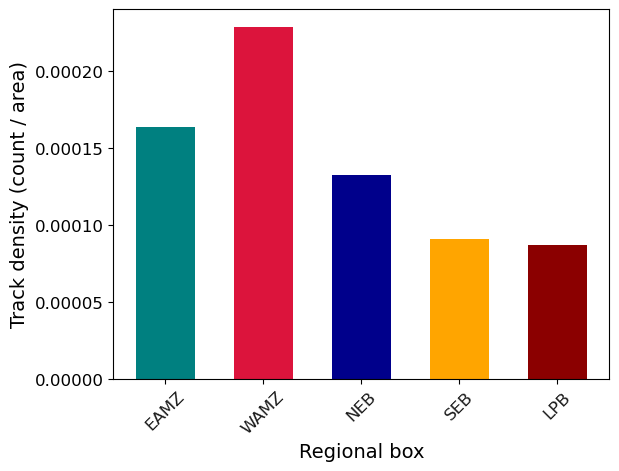

In [33]:
# Plot of total no. MCSs in each region in Jan 2005

import matplotlib
matplotlib.rcdefaults()

# Choose the height of the bars
height = [td_eamz, td_wamz, td_neb, td_seb, td_lpb]

# Choose the names of the bars
bars = ('EAMZ', 'WAMZ', 'NEB', 'SEB', 'LPB')
x_pos = np.arange(len(bars))

c = ['teal', 'crimson', 'darkblue', 'orange', 'darkred']

# Create bars
plt.bar(bars, height, color=c, width=0.6)
plt.xticks(x_pos, bars, color='k',fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.ylabel('Track density (count / area)',fontsize=14)
plt.xlabel('Regional box',fontsize=14)

Text(0.5, 0, 'Regional box')

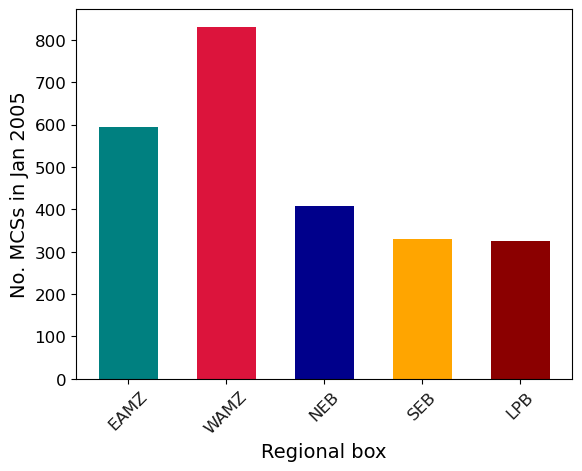

In [35]:
# Plot of total no. MCSs in each region in Jan 2005

import matplotlib
matplotlib.rcdefaults()

# Choose the height of the bars
height = [595, 831, 407, 331, 325]

# Choose the names of the bars
bars = ('EAMZ', 'WAMZ', 'NEB', 'SEB', 'LPB')
x_pos = np.arange(len(bars))

c = ['teal', 'crimson', 'darkblue', 'orange', 'darkred']

# Create bars
plt.bar(bars, height, color=c, width=0.6)
plt.xticks(x_pos, bars, color='k',fontsize=12, rotation=45)
plt.yticks(fontsize=12)
plt.ylabel('No. MCSs in Jan 2005',fontsize=14)
plt.xlabel('Regional box',fontsize=14)

In [184]:
# lifetime analysis

#code from the calculate lifetime function in tobac but here I've taken it out of the function so that it's easier to 
#apply to histograms, means, max and mins. It has also been converted from minutes to hours

bin_edges=np.arange(6,30,2)
density=False

eamz_cell = eamz_tracks.groupby("cell")
minutes_eamz = (eamz_cell["time_cell"].max() / pd.Timedelta(minutes=1)).values
lifetime_eamz = minutes_eamz/60 #converting from minutes to hours

wamz_cell = wamz_tracks.groupby("cell")
minutes_wamz = (wamz_cell["time_cell"].max() / pd.Timedelta(minutes=1)).values
lifetime_wamz = minutes_wamz/60 #converting from minutes to hours

neb_cell = neb_tracks.groupby("cell")
minutes_neb = (neb_cell["time_cell"].max() / pd.Timedelta(minutes=1)).values
lifetime_neb = minutes_neb/60 #converting from minutes to hours

seb_cell = seb_tracks.groupby("cell")
minutes_seb = (seb_cell["time_cell"].max() / pd.Timedelta(minutes=1)).values
lifetime_seb = minutes_seb/60 #converting from minutes to hours

lpb_cell = lpb_tracks.groupby("cell")
minutes_lpb = (lpb_cell["time_cell"].max() / pd.Timedelta(minutes=1)).values
lifetime_lpb = minutes_lpb/60 #converting from minutes to hours


In [185]:
eamz_histo, bins = np.histogram(lifetime_eamz, bins= np.linspace(4,50,24))
wamz_histo, bins = np.histogram(lifetime_wamz, bins= np.linspace(4,50,24))
neb_histo, bins = np.histogram(lifetime_neb, bins= np.linspace(4,50,24))
seb_histo, bins = np.histogram(lifetime_seb, bins= np.linspace(4,50,24))
lpb_histo, bins = np.histogram(lifetime_lpb, bins= np.linspace(4,50,24))

In [186]:
# lifetime as proportions
eamz_hist = eamz_histo/np.nansum(eamz_histo) * 100
wamz_hist =wamz_histo/np.nansum(wamz_histo) * 100
neb_hist = neb_histo/np.nansum(neb_histo) * 100
seb_hist = seb_histo/np.nansum(seb_histo) * 100
lpb_hist = lpb_histo/np.nansum(lpb_histo) * 100

<function matplotlib.pyplot.legend(*args, **kwargs)>

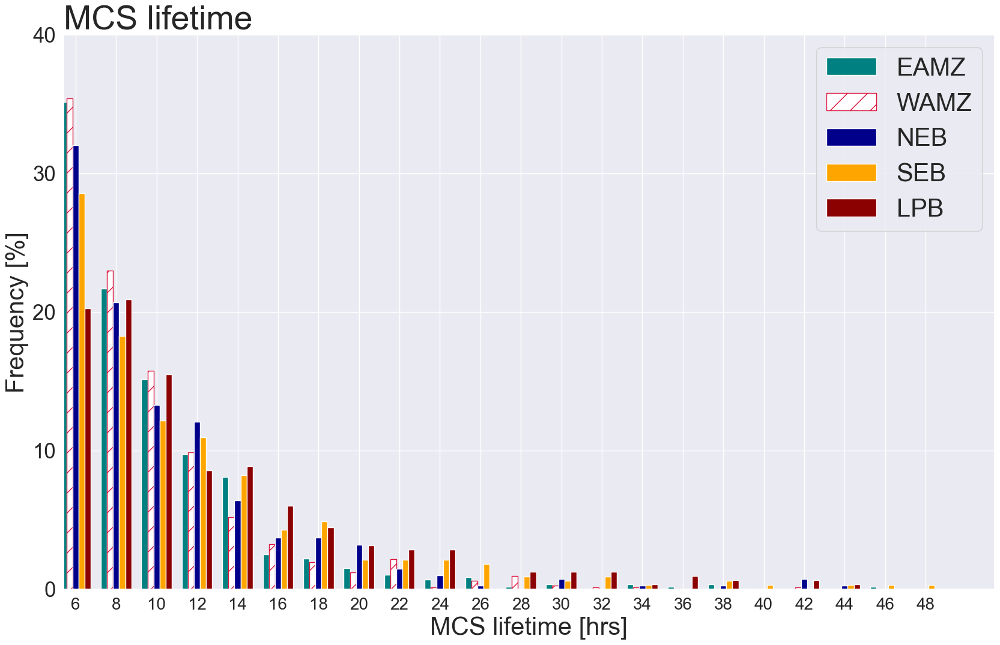

In [193]:
fig = plt.figure(figsize=(20,12))

ax = fig.add_subplot(111)

sns.set(font_scale=1.5)

t = 40
f= 30
n=25
lf= 35

N = 23
ind = np.arange(N) 
width = 0.15

plt.title('MCS lifetime', loc='left', fontsize= t )
eamz = eamz_hist
bar1 = plt.bar(ind, eamz, width, color = 'teal',label='EAMZ')
  
wamz = wamz_hist
bar2 = plt.bar(ind+width, wamz, width, color= 'white', edgecolor='crimson',hatch='/',label='WAMZ')
  
neb = neb_hist
bar3 = plt.bar(ind+width*2, neb, width, color = 'darkblue',label='NEB')

seb = seb_hist
bar4 = plt.bar(ind+width*3, seb, width, color = 'orange',label='SEB')

lpb = lpb_hist
bar5 = plt.bar(ind+width*4, lpb, width, color = 'darkred',label='LPB')
  
plt.xlabel("MCS lifetime [hrs]",fontsize=f)
plt.ylabel('Frequency [%]',fontsize=f)
plt.xticks(ind+width*2, bins.astype(int)[:-1], fontsize=20)
plt.xlim(1,24)
plt.yticks(np.arange(0,50)[::10],fontsize=n)
plt.legend(loc='upper right',fontsize=f)

#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))
#ax.xaxis.set_major_formatter(scientific_formatter)
plt.legend

In [199]:
lpb_tracks = lpb_tracks[lpb_tracks.num >= 1975]

In [202]:
lpb_tracks['area'] = lpb_tracks['num']*4.5**2

In [204]:
lpb_tracks.area.mean

<bound method NDFrame._add_numeric_operations.<locals>.mean of 0          73244.25
12         83794.50
27        164895.75
44        173664.00
58        168824.25
            ...    
104002     98658.00
104012    102991.50
104025    109836.00
104034     87034.50
104040     69417.00
Name: area, Length: 5045, dtype: float64>

(0.0, 1000000.0)

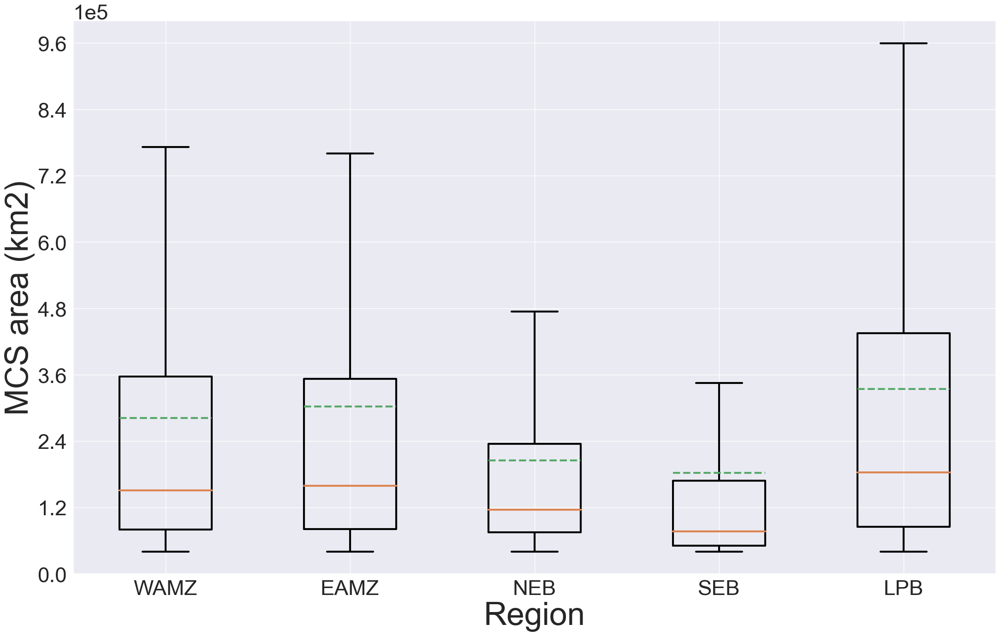

In [64]:
sns.set_style('ticks')
sns.set(font_scale=3)

WAMZ = (wamz_tracks.num*4.5**2)
EAMZ = (eamz_tracks.num*4.5**2)
NEB = (neb_tracks.num*4.5**2)
SEB = (seb_tracks.num*4.5**2)
LPB = (lpb_tracks.num*4.5**2)

data=[WAMZ, EAMZ, NEB, SEB, LPB]

fig = plt.figure(figsize=(20,12))

ax = fig.add_axes([0, 0, 1, 1])

bp = ax.boxplot(data, flierprops=dict(marker='s',markerfacecolor='red'), showfliers=False, showmeans=True, meanline=True, medianprops=dict(linewidth=3), whiskerprops=dict(linewidth=3), capprops=dict(linewidth=3), boxprops=dict(linewidth=3), meanprops=dict(linewidth=3), labels=['WAMZ', 'EAMZ', 'NEB', 'SEB', 'LPB'])
ax.set_ylabel('MCS area (km2)',fontsize=50)
ax.set_xlabel('Region',fontsize=50)
ax.set_yticks(np.arange(0,1000000,120000))
plt.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax.set_ylim(0,1000000)


In [65]:
# diurnal cycle

dataframes= [wamz_tracks, eamz_tracks, neb_tracks, seb_tracks, lpb_tracks]

for df in dataframes:
    df.timestr = df.timestr.astype(str)
    df['datetime'] = pd.to_datetime(df.timestr.str.split(',\s*').str[0]) 
    set(df['datetime'])

In [68]:
# plot of initiation and dissipation times
# ========================================
import functions

#wamz
init_hours_wamz = functions.get_mcs_init(wamz_tracks)
init_hours_wamz = np.array(init_hours_wamz)
init_hours_wamz, bins = np.histogram(init_hours_wamz, bins = np.arange(0,25))

diss_hours_wamz = functions.get_mcs_diss(wamz_tracks)
diss_hours_wamz = np.array(diss_hours_wamz)
diss_hours_wamz, bins = np.histogram(diss_hours_wamz, bins = np.arange(0,25))

init_wamz = init_hours_wamz/np.nansum(init_hours_wamz) * 100
diss_wamz = diss_hours_wamz/np.nansum(diss_hours_wamz) * 100


#eamz
init_hours_eamz = functions.get_mcs_init(eamz_tracks)
init_hours_eamz = np.array(init_hours_eamz)
init_hours_eamz, bins = np.histogram(init_hours_eamz, bins = np.arange(0,25))

diss_hours_eamz = functions.get_mcs_diss(eamz_tracks)
diss_hours_eamz = np.array(diss_hours_eamz)
diss_hours_eamz, bins = np.histogram(diss_hours_eamz, bins = np.arange(0,25))

init_eamz = init_hours_eamz/np.nansum(init_hours_eamz) * 100
diss_eamz = diss_hours_eamz/np.nansum(diss_hours_eamz) * 100



#neb
init_hours_neb = functions.get_mcs_init(neb_tracks)
init_hours_neb = np.array(init_hours_neb)
init_hours_neb, bins = np.histogram(init_hours_neb, bins = np.arange(0,25))

diss_hours_neb = functions.get_mcs_diss(neb_tracks)
diss_hours_neb = np.array(diss_hours_neb)
diss_hours_neb, bins = np.histogram(diss_hours_neb, bins = np.arange(0,25))

init_neb = init_hours_neb/np.nansum(init_hours_neb) * 100
diss_neb = diss_hours_neb/np.nansum(diss_hours_neb) * 100

#eb
# init_hours_eb = functions.get_mcs_init(eb_tracks)
# init_hours_eb = np.array(init_hours_eb)
# init_hours_eb, bins = np.histogram(init_hours_eb, bins = np.arange(0,25))

# diss_hours_eb = functions.get_mcs_diss(eb_tracks)
# diss_hours_eb = np.array(diss_hours_eb)
# diss_hours_eb, bins = np.histogram(diss_hours_eb, bins = np.arange(0,25))

# init_eb = init_hours_eb/np.nansum(init_hours_eb) * 100
# diss_eb = diss_hours_eb/np.nansum(diss_hours_eb) * 100

# max_hours_rain_eb = functions.get_mcs_max_precip(eb_tracks)

# max_hours_tb_eb = functions.get_mcs_min_tb(eb_tracks)

#seb
init_hours_seb = functions.get_mcs_init(seb_tracks)
init_hours_seb = np.array(init_hours_seb)
init_hours_seb, bins = np.histogram(init_hours_seb, bins = np.arange(0,25))

diss_hours_seb = functions.get_mcs_diss(seb_tracks)
diss_hours_seb = np.array(diss_hours_seb)
diss_hours_seb, bins = np.histogram(diss_hours_seb, bins = np.arange(0,25))

init_seb = init_hours_seb/np.nansum(init_hours_seb) * 100
diss_seb = diss_hours_seb/np.nansum(diss_hours_seb) * 100

#lpb
init_hours_lpb = functions.get_mcs_init(lpb_tracks)
init_hours_lpb = np.array(init_hours_lpb)
init_hours_lpb, bins = np.histogram(init_hours_lpb, bins = np.arange(0,25))

diss_hours_lpb = functions.get_mcs_diss(lpb_tracks)
diss_hours_lpb = np.array(diss_hours_lpb)
diss_hours_lpb, bins = np.histogram(diss_hours_lpb, bins = np.arange(0,25))

init_lpb = init_hours_lpb/np.nansum(init_hours_lpb) * 100
diss_lpb = diss_hours_lpb/np.nansum(diss_hours_lpb) * 100




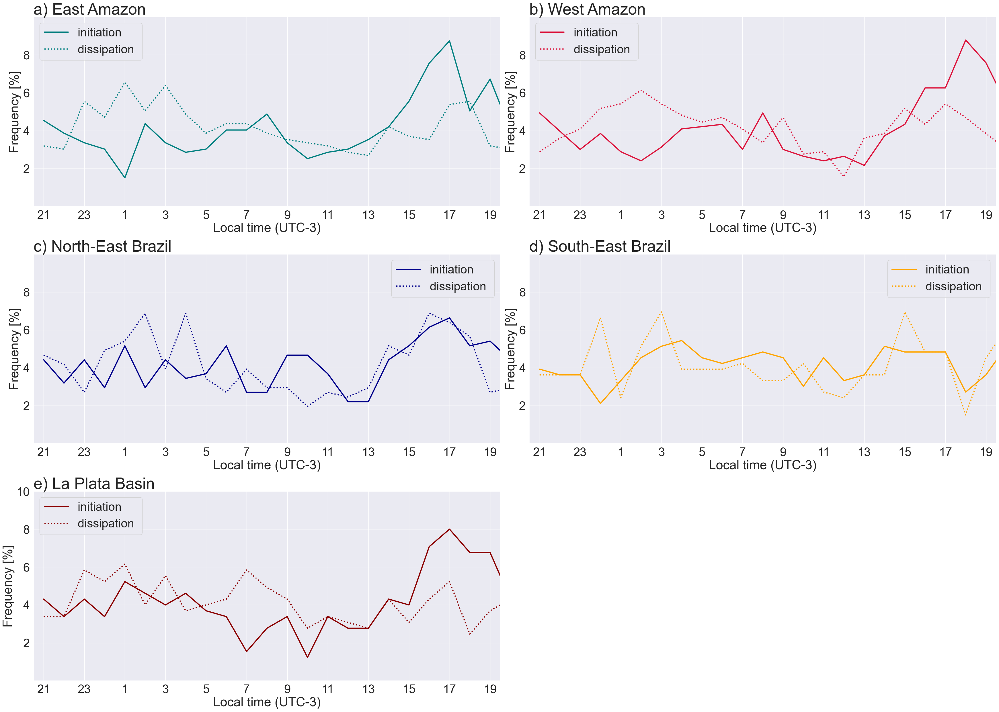

In [74]:
#plot of initiation time of MCSs 
import seaborn as sns 
sns.set()

plt.figure(figsize=(35,25))
f= 30
lf= 30
l=32

ax1 = plt.subplot(3, 2, 1) 
ax1.set_title('a) East Amazon ', loc='left', fontsize= 40)
ax1.plot(np.arange(0,24), init_eamz, label = 'initiation ', color= 'teal', linewidth = 3)
ax1.plot(np.arange(0,24), diss_eamz, label = 'dissipation ', color= 'teal', linewidth = 3, linestyle = 'dotted')
#ax1.plot(np.arange(0,24), max_hours_rain_unfiltered, label = 'rain_maxima ', color= 'darkblue', linewidth = 3, linestyle = '-')
#ax1.plot(np.arange(0,24), max_hours_tb_unfiltered, label = 'tb_minima ', color= 'darkblue', linewidth = 3, linestyle = '-,')
ax1.legend(fontsize=lf)

a= np.arange(21,24,2)
b= np.arange(1,20,2)
localtime= np.append(a, b)

labels=localtime.astype(str)
ax1.set_yticks(np.arange(2,10,2))
ax1.set_xticks(np.arange(0,23)[::2])
ax1.set_yticklabels(ax1.get_yticks(),fontsize=f)
ax1.set_xticklabels(labels,fontsize= f)
ax1.set_xlim(-0.5,22.5)
ax1.set_ylim(0,10)
ax1.set_xlabel('Local time (UTC-3)', fontsize= l)
ax1.set_ylabel('Frequency [%]', fontsize= l)


labels=localtime.astype(str)
ax2 = plt.subplot(3, 2, 2) 
ax2.set_title('b) West Amazon', loc='left', fontsize= 40)
ax2.plot(np.arange(0,24), init_wamz, label = 'initiation ', color= 'crimson', linewidth = 3)
ax2.plot(np.arange(0,24), diss_wamz, label = 'dissipation ', color= 'crimson', linewidth = 3, linestyle = 'dotted')
#ax2.plot(np.arange(0,24), max_hours_rain_filtered, label = 'rain_maxima ', color= 'crimson', linewidth = 3, linestyle = '-.',alpha=0.5)
#ax2.plot(np.arange(0,24), max_hours_tb_filtered, label = 'tb_minima ', color= 'crimson', linewidth = 3, linestyle = '--',alpha=0.5)

ax2.legend(fontsize=lf)
ax2.set_yticks(np.arange(2,10,2))
ax2.set_xticks(np.arange(0,23)[::2])
ax2.set_xticklabels(labels,fontsize= f)
ax2.set_xlim(-0.5,22.5)
ax2.set_ylim(0,10)
ax2.set_yticklabels(ax2.get_yticks(),fontsize=f)
ax2.set_xlabel('Local time (UTC-3)', fontsize= l)
ax2.set_ylabel('Frequency [%]', fontsize= l)


labels=localtime.astype(str)
ax3 = plt.subplot(3, 2, 3) 
ax3.set_title('c) North-East Brazil', loc='left', fontsize= 40)
ax3.plot(np.arange(0,24), init_neb, label = 'initiation ', color= 'darkblue', linewidth = 3)
ax3.plot(np.arange(0,24), diss_neb, label = 'dissipation ', color= 'darkblue', linewidth = 3, linestyle = 'dotted')
#ax3.plot(np.arange(0,24), max_hours_rain_filtered_210, label = 'rain_maxima ', color= 'orange', linewidth = 3, linestyle = '-.',alpha=0.5)
#ax3.plot(np.arange(0,24), max_hours_tb_filtered_210, label = 'tb_minima ', color= 'orange', linewidth = 3, linestyle = '--',alpha=0.5)

ax3.legend(fontsize=lf)
ax3.set_yticks(np.arange(2,10,2))
ax3.set_xticks(np.arange(0,23)[::2])
ax3.set_xticklabels(labels,fontsize= f)
ax3.set_xlim(-0.5,22.5)
ax3.set_ylim(0,10)
ax3.set_yticklabels(ax3.get_yticks(),fontsize=f)
ax3.set_xlabel('Local time (UTC-3)', fontsize= l)
ax3.set_ylabel('Frequency [%]', fontsize= l)


# labels=localtime.astype(str)
# ax4 = plt.subplot(3, 2, 4) 
# ax4.set_title('d) East Brazil', loc='left', fontsize= 40)
# ax4.plot(np.arange(0,24), init_eb, label = 'initiation ', color= 'purple', linewidth = 3)
# ax4.plot(np.arange(0,24), diss_eb, label = 'dissipation ', color= 'purple', linewidth = 3, linestyle = 'dotted')
# #ax3.plot(np.arange(0,24), max_hours_rain_filtered_215, label = 'rain_maxima ', color= 'orange', linewidth = 3, linestyle = '-.',alpha=0.5)
# #ax3.plot(np.arange(0,24), max_hours_tb_filtered_215, label = 'tb_minima ', color= 'orange', linewidth = 3, linestyle = '--',alpha=0.5)

# ax4.legend(fontsize=lf)
# ax4.set_yticks(np.arange(2,10,2))
# ax4.set_xticks(np.arange(0,23)[::2])
# ax4.set_xticklabels(labels,fontsize= f)
# ax4.set_xlim(-0.5,22.5)
# ax4.set_yticklabels(ax4.get_yticks(),fontsize=f)
# ax4.set_xlabel('Local time (UTC-3)', fontsize= l)
# ax4.set_ylabel('Frequency [%]', fontsize= l)


labels=localtime.astype(str)
ax4 = plt.subplot(3, 2, 4) 
ax4.set_title('d) South-East Brazil', loc='left', fontsize= 40)
ax4.plot(np.arange(0,24), init_seb, label = 'initiation ', color= 'orange', linewidth = 3)
ax4.plot(np.arange(0,24), diss_seb, label = 'dissipation ', color= 'orange', linewidth = 3, linestyle = 'dotted')
#ax3.plot(np.arange(0,24), max_hours_rain_filtered_215, label = 'rain_maxima ', color= 'orange', linewidth = 3, linestyle = '-.',alpha=0.5)
#ax3.plot(np.arange(0,24), max_hours_tb_filtered_215, label = 'tb_minima ', color= 'orange', linewidth = 3, linestyle = '--',alpha=0.5)

ax4.legend(fontsize=lf)
ax4.set_yticks(np.arange(2,10,2))
ax4.set_xticks(np.arange(0,23)[::2])
ax4.set_xticklabels(labels,fontsize= f)
ax4.set_xlim(-0.5,22.5)
ax4.set_ylim(0,10)
ax4.set_yticklabels(ax4.get_yticks(),fontsize=f)
ax4.set_xlabel('Local time (UTC-3)', fontsize= l)
ax4.set_ylabel('Frequency [%]', fontsize= l)


labels=localtime.astype(str)
ax5 = plt.subplot(3, 2, 5) 
ax5.set_title('e) La Plata Basin', loc='left', fontsize= 40)
ax5.plot(np.arange(0,24), init_lpb, label = 'initiation ', color= 'darkred', linewidth = 3)
ax5.plot(np.arange(0,24), diss_lpb, label = 'dissipation ', color= 'darkred', linewidth = 3, linestyle = 'dotted')
#ax3.plot(np.arange(0,24), max_hours_rain_filtered_215, label = 'rain_maxima ', color= 'orange', linewidth = 3, linestyle = '-.',alpha=0.5)
#ax3.plot(np.arange(0,24), max_hours_tb_filtered_215, label = 'tb_minima ', color= 'orange', linewidth = 3, linestyle = '--',alpha=0.5)

ax5.legend(fontsize=lf)
ax5.set_yticks(np.arange(2,20,2))
ax5.set_xticks(np.arange(0,23)[::2])
ax5.set_xticklabels(labels,fontsize= f)
ax5.set_xlim(-0.5,22.5)
ax5.set_ylim(0,10)
ax5.set_yticklabels(ax5.get_yticks(),fontsize=f)
ax5.set_xlabel('Local time (UTC-3)', fontsize= l)
ax5.set_ylabel('Frequency [%]', fontsize= l)

plt.tight_layout()



Text(0.0, 1.0, 'MCS tracks by region (2005) - cloud shield only')

<Figure size 640x480 with 0 Axes>

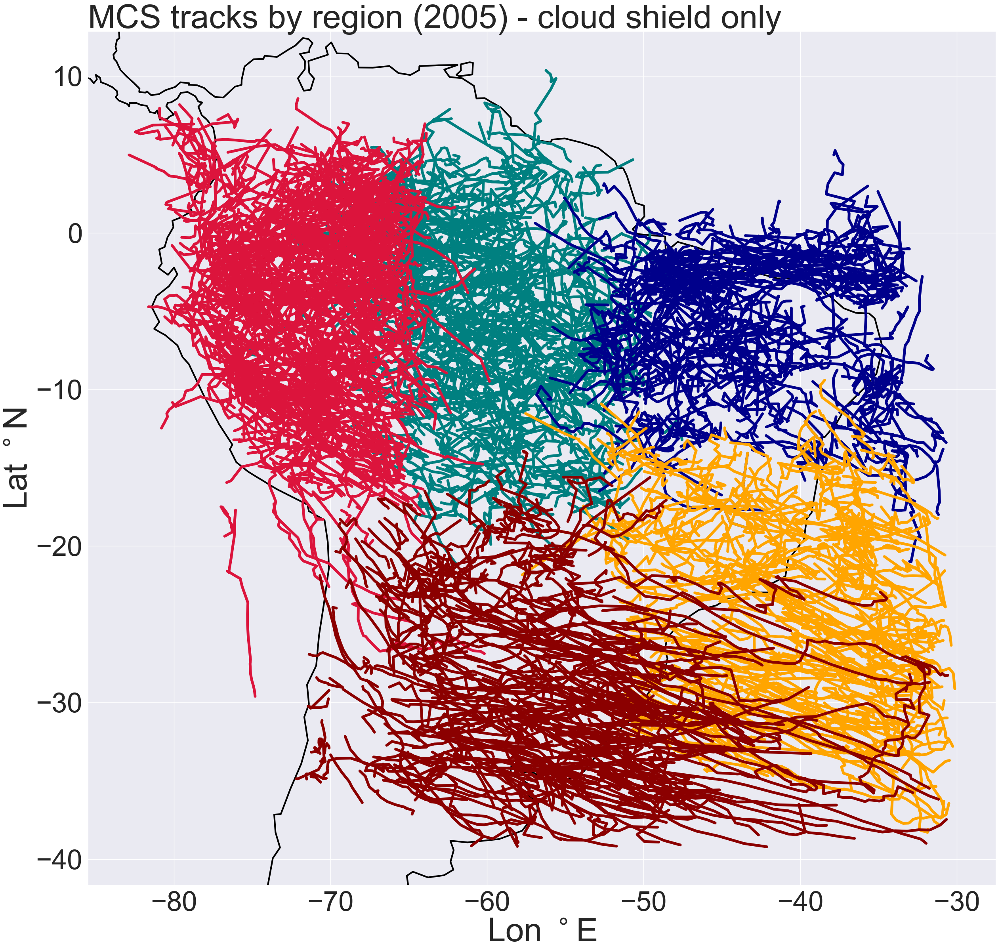

In [78]:
# location of tracks

axis_extent=[-80,-30,-35,12]

plt.figure()

fig_map,ax_map=plt.subplots(figsize=(30,28),subplot_kw={'projection': ccrs.PlateCarree()})
for cell in eamz_tracks['cell'].dropna().unique():
    if cell == -1:
        continue
    eamz_i = eamz_tracks[eamz_tracks['cell'] == cell]
    plt.plot(eamz_i['projection_x_coordinate'],eamz_i['projection_y_coordinate'], '-',linewidth=5,zorder=2, color='teal')

for cell in wamz_tracks['cell'].dropna().unique():
    if cell == -1:
        continue
    wamz_i = wamz_tracks[wamz_tracks['cell'] == cell]
    plt.plot(wamz_i['projection_x_coordinate'],wamz_i['projection_y_coordinate'], '-',linewidth=5,zorder=2, color='crimson')

for cell in neb_tracks['cell'].dropna().unique():
    if cell == -1:
        continue
    neb_i = neb_tracks[neb_tracks['cell'] == cell]
    plt.plot(neb_i['projection_x_coordinate'],neb_i['projection_y_coordinate'], '-',linewidth=5,zorder=2, color='darkblue')

# for cell in eb_tracks['cell'].dropna().unique():
#     if cell == -1:
#         continue
#     eb_i = eb_tracks[eb_tracks['cell'] == cell]
#     plt.plot(eb_i['longitude'],eb_i['latitude'], '-',linewidth=5,zorder=2, color='purple')

for cell in seb_tracks['cell'].dropna().unique():
    if cell == -1:
        continue
    seb_i = seb_tracks[seb_tracks['cell'] == cell]
    plt.plot(seb_i['projection_x_coordinate'],seb_i['projection_y_coordinate'], '-',linewidth=5,zorder=2, color='orange')

for cell in lpb_tracks['cell'].dropna().unique():
    if cell == -1:
        continue
    lpb_i = lpb_tracks[lpb_tracks['cell'] == cell]
    plt.plot(lpb_i['projection_x_coordinate'],lpb_i['projection_y_coordinate'], '-',linewidth=5,zorder=2, color='darkred')

plt.gca().coastlines(linewidth=3)

plt.xticks([-80,-70,-60,-50,-40,-30],fontsize=50)
plt.yticks([-40,-30,-20,-10,0,10],fontsize=50)
plt.xlabel('Lon $^\circ$E', fontsize=60)
plt.ylabel('Lat $^\circ$N', fontsize=60)

plt.title("MCS tracks by region (2005) - cloud shield only",fontsize=60, loc='left')



In [79]:
# MCS area plots
# ==============

area_eamz=functions.get_area(eamz_tracks)
area_wamz=functions.get_area(wamz_tracks)
area_neb=functions.get_area(neb_tracks)
#area_eb=functions.get_area(eb_tracks)
area_seb=functions.get_area(seb_tracks)
area_lpb=functions.get_area(lpb_tracks)


array of MCS areas generated.
array of MCS areas generated.
array of MCS areas generated.
array of MCS areas generated.
array of MCS areas generated.


In [80]:
eamz_area_histo, bins = np.histogram(area_eamz, bins= np.linspace(60000,420000,10))
wamz_area_histo, bins = np.histogram(area_wamz, bins= np.linspace(60000,420000,10))
neb_area_histo, bins = np.histogram(area_neb, bins= np.linspace(60000,420000,10))
#eb_area_histo, bins = np.histogram(area_eb, bins= np.linspace(60000,420000,10))
seb_area_histo, bins = np.histogram(area_seb, bins= np.linspace(60000,420000,10))
lpb_area_histo, bins = np.histogram(area_lpb, bins= np.linspace(60000,420000,10))

In [81]:
# areas as proportions
eamz_hist = eamz_area_histo/np.nansum(eamz_area_histo) * 100
wamz_hist = wamz_area_histo/np.nansum(wamz_area_histo) * 100
neb_hist = neb_area_histo/np.nansum(neb_area_histo) * 100
#eb_hist = eb_area_histo/np.nansum(eb_area_histo) * 100
seb_hist = seb_area_histo/np.nansum(seb_area_histo) * 100
lpb_hist = lpb_area_histo/np.nansum(lpb_area_histo) * 100

<function matplotlib.pyplot.legend(*args, **kwargs)>

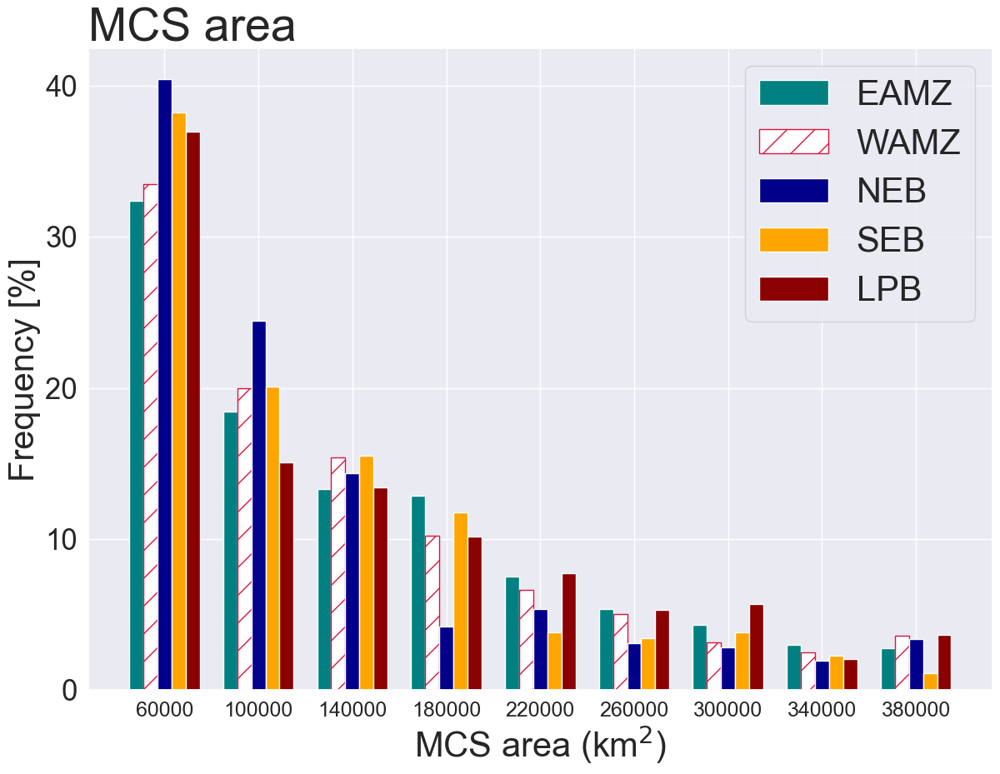

In [84]:
fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

sns.set(font_scale=1.5)

t = 40
f= 30
n=25
lf= 35

N = 9
ind = np.arange(N) 
width = 0.15

plt.title('MCS area', loc='left', fontsize= t )
eamz = eamz_hist
bar1 = plt.bar(ind, eamz, width, color = 'teal',label='EAMZ')
  
wamz = wamz_hist
bar2 = plt.bar(ind+width, wamz, width, color= 'white', edgecolor='crimson',hatch='/',label='WAMZ')
  
neb = neb_hist
bar3 = plt.bar(ind+width*2, neb, width, color = 'darkblue',label='NEB')

seb = seb_hist
bar4 = plt.bar(ind+width*3, seb, width, color = 'orange',label='SEB')

lpb = lpb_hist
bar5 = plt.bar(ind+width*4, lpb, width, color = 'darkred',label='LPB')
  
plt.xlabel("MCS area (km$^{2}$)",fontsize=f)
plt.ylabel('Frequency [%]',fontsize=f)
plt.xticks(ind+width*2, bins.astype(int)[:-1], fontsize=18)
plt.yticks(np.arange(0,50)[::10],fontsize=n)
plt.legend(loc='upper right',fontsize=f)

#ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.1e'))
#ax.xaxis.set_major_formatter(scientific_formatter)
plt.legend

In [85]:
# velocity

import tobac

#first need to run the tobac calculate velocity function before running my own function to create the histogram
vel_eamz= tobac.calculate_velocity(eamz_tracks, method_distance=None)
vel_wamz = tobac.calculate_velocity(wamz_tracks, method_distance=None)
vel_neb = tobac.calculate_velocity(neb_tracks, method_distance=None)
vel_seb = tobac.calculate_velocity(seb_tracks, method_distance=None)
vel_lpb = tobac.calculate_velocity(lpb_tracks, method_distance=None)




/home/h03/hgilmour/.conda/envs/myclone/lib/python3.9/site-packages/tobac/analysis.py:572: RuntimeWarning: divide by zero encountered in double_scalars
  velocity = distance / diff_time
/home/h03/hgilmour/.conda/envs/myclone/lib/python3.9/site-packages/tobac/analysis.py:572: RuntimeWarning: divide by zero encountered in double_scalars
  velocity = distance / diff_time
